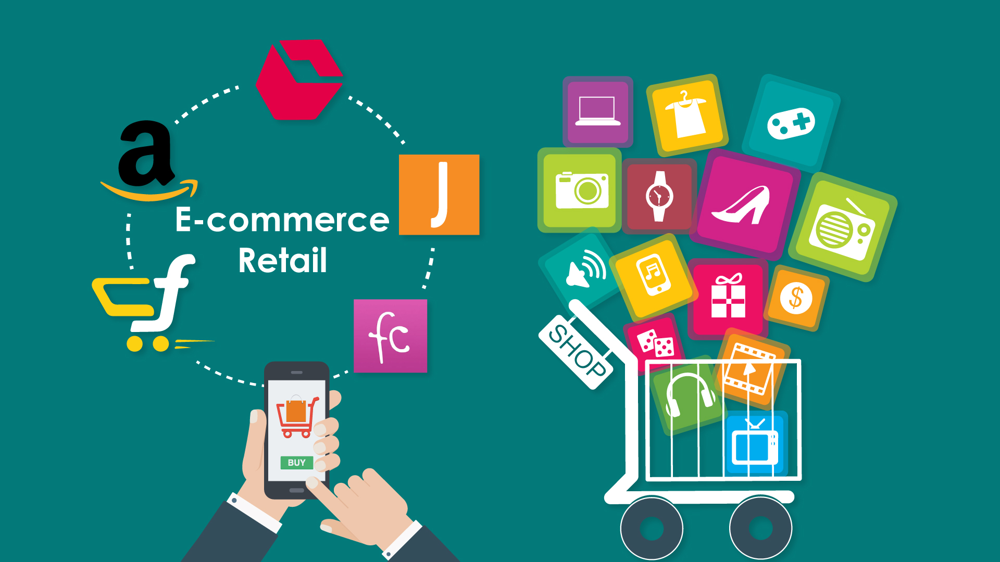

## OVERVIEW

Welcome to "RFM Customer Segmentation, Hierarchical Clustering & Cohort Analysis Study".

In this study, we will apply RFM Analysis, Hierarchical Clustering and Customer Segmentation using K-Means Clustering.

Before diving into the project, please take a look at the determines and project structure.

## DATA


Using the [Online Retail dataset](https://archive.ics.uci.edu/ml/datasets/Online+Retail) from the UCI Machine Learning Repository for exploratory data analysis, ***Customer Segmentation***, ***RFM Analysis***, ***K-Means Clustering*** and ***Cohort Analysis***.

This is a transnational data set which contains all the transactions occurring between 01/12/2010 and 09/12/2011 for a UK-based and registered non-store online retail. The company mainly sells unique all-occasion gifts. Many customers of the company are wholesalers.

## Business Goal

"Predict behavior to retain customers. We can analyze all relevant customer data and develop focused customer retention programs."

Each row represents a customer, each column contains customer’s attributes described on the column Metadata.



### About The Features

**The features in the given dataset are:**

**InvoiceNo**: Invoice number. *Nominal*, a 6-digit integral number uniquely assigned to each transaction. If this code starts with letter 'c', it indicates a cancellation.
<br>
**StockCode**: Product (item) code. *Nominal*, a 5-digit integral number uniquely assigned to each distinct product.
<br>
**Description**: Product (item) name. *Nominal*.
<br>
**Quantity**: The quantities of each product (item) per transaction. *Numeric*.
<br>
**InvoiceDate**: Invoice Date and time. *Numeric*, the day and time when each transaction was generated.
<br>
**UnitPrice**: Unit price. *Numeric*, Product price per unit in sterling.
<br>
**CustomerID**: Customer number. *Nominal*, a 5-digit integral number uniquely assigned to each customer.
<br>
**Country**: Country name. *Nominal*, the name of the country where each customer resides.

### What The Problem Is

First of all, to observe the structure of the data and missing values, we can use exploratory data analysis and data visualization techniques.

We must do descriptive analysis. Because we must understand the relationship of the features to each other and clear the noise and missing values in the data. After that, the data set will be ready for RFM analysis.

Before starting the RFM Analysis, we will be asked to do some analysis regarding the distribution of *Orders*, *Customers* and *Countries*. These analyzes will help the company develop its sales policies and contribute to the correct use of resources.

We will notice that the UK not only has the most sales revenue, but also the most customers. So we will continue to analyze only UK transactions in the next RFM Analysis, Customer Segmentation and K-Means Clustering topics.

Next, we will begin RFM Analysis, a customer segmentation technique based on customers' past purchasing behavior.

By using RFM Analysis, we can enable companies to develop different approaches to different customer segments so that they can get to know their customers better, observe trends better, and increase customer retention and sales revenues.

We will calculate the Recency, Frequency and Monetary values of the customers in the RFM Analysis we will make using the data consisting of UK transactions. Ultimately, we have to create an RFM table containing these values.

In the Customer Segmentation section, we will create an RFM Segmentation Table where we segment wer customers by using the RFM table. For example, we can label the best customer as "Big Spenders" and the lost customer as "Lost Customer".

We will segment the customers ourselves based on their recency, frequency, and monetary values. But can an **unsupervised learning** model do this better for us? we will use the K-Means algorithm to find the answer to this question. Then we will compare the classification made by the algorithm with the classification we have made werself.

Before applying K-Means Clustering, we need to perform data pre-processing. In this context, it is important to examine feature correlations and distributions to better understand variable behavior. Additionally, the data used for K-Means must be normalized, as the algorithm is distance-based and sensitive to scale differences.

Once the data is normalized, we will apply Hierarchical Clustering as an additional method to explore the natural structure of the data. Hierarchical Clustering allows us to visualize dendrograms and observe how observations merge into clusters step by step. This technique helps validate whether distinct groupings exist and provides insight into the appropriate number of clusters before confirming with K-Means. It also supports segmentation flexibility, especially when aiming to derive 3-level segmentation (e.g., high, medium, and low-value customers).

We then proceed to apply K-Means Clustering, which requires specifying the number of clusters in advance. To determine the optimal number of clusters, we will use the Elbow Method and Silhouette Analysis, both of which help evaluate model performance and ensure meaningful segmentation.

After determining the optimal number of clusters, we perform clustering using K-Means and visualize the results using a scatter plot. Finally, to interpret the characteristics of each cluster, we will examine boxplots for the underlying features. This helps us understand the differences between clusters and assign meaningful labels, enabling targeted strategies for each segment.

Finally, we will do Cohort Analysis with the data we used at the beginning, regardless of the analysis we have done before. Cohort analysis is a subset of behavioral analytics that takes the user data and breaks them into related groups for analysis. This analysis can further be used to do customer segmentation and track metrics like retention, churn, and lifetime value.

### Study Structure

- Data Cleaning & Exploratory Data Analysis
- RFM Analysis
- Customer Segmentation
- Hierarchical Clustering for complement and validate K-Means segmentation
- Applying K-Means Clustering
- Create Cohort and Conduct Cohort Analysis

# 1. Data Cleaning & Exploratory Data Analysis

- Import Modules, Load Data & Data Review

- Follow the Steps Below

*i. Converting data type of the feature*

*ii. Handling Missing Value*

*iii. Delete Duplicate Values*

*iv. Explore the Orders*

*v. Get rid of cancellation and Negative Value*

*vi. Lets Explore Global Market*

*vii. Explore the UK Market*


## Import Modules, Load Data & Data Review

In [ ]:
!pip install pyforest

import ipywidgets
from ipywidgets import interact

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.ticker as mticker
!pip install squarify
import plotly.express as px

import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import missingno as msno

import datetime as dt
from datetime import datetime

# Scaling
from sklearn.preprocessing import scale, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import make_column_transformer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


# Importing plotly and cufflinks in offline mode
import plotly.express as px
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

from wordcloud import WordCloud

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Figure&Display options
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

  Preparing metadata (setup.py) ... done
  Created wheel for pyforest: filename=pyforest-1.1.2-py2.py3-none-any.whl size=15902 sha256=88f5f54e2b0876d341d44b561920354aa541a8f638c8597e863270c188bba1fb
  Stored in directory: /root/.cache/pip/wheels/50/94/94/c8224da834a4db55f67c86feb7c742111ff051d5f3e17127d8
Successfully built pyforest


In [ ]:
## Missing Value Functions

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number']>0]

## Descriptive Functions

def review(df):
    print("Shape:", df.shape,'\n', ('*'*100), ("\nInfo:\n"), sep='')
    print(df.info(), '\n', ('*'*100), sep='')
    print("Number of Uniques:\n", df.nunique(),'\n', ('*'*100), sep='')
    print("Missing Values:\n", missing_values(df),'\n', ('*'*100), sep='')
    print("All Columns:", list(df.columns),'\n', ('*'*100), sep='')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')
    print("Columns after rename:", list(df.columns),'\n', ('*'*100), sep='')
    print("Columns after rename:", list(df.columns),'\n', ('*'*100), sep='')
    print("Descriptive Statistics \n", df.describe().round(2),'\n', ('*'*100), sep='') # Gives a statstical breakdown of the data.
    print("Descriptive Statistics (Categorical Columns) \n", df.describe(include=object).T,'\n', ('*'*100), sep='')

def multicolinearity_control(df):
    feature =[]
    collinear=[]
    for col in df.corr().columns:
        for i in df.corr().index:
            if (abs(df.corr()[col][i])> .9 and abs(df.corr()[col][i]) < 1):
                    feature.append(col)
                    collinear.append(i)
                    print(f"Multicolinearity alert in between:{col} - {i}",
                                  df.shape,'\n', ('*'*100,), sep='')

def duplicate_values(df):
    print("Duplicate check...", sep='')
    print("There are", df.duplicated(subset=None, keep='first').sum(), "duplicated observations in the dataset.")


def drop_null(df, limit):
    print('Shape:', df.shape)
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'null and were dropped')
            df.drop(i, axis=1, inplace=True)
            print('new shape:', df.shape)
    print('New shape after missing value control:', df.shape)

###############################################################################

## To view summary information about the columns

def initial_look(col):
    print("column name    : ", col)
    print("--------------------------------")
    print("Per_of_Nulls   : ", "%", round(df[col].isnull().sum()/df.shape[0]*100, 2))
    print("Num_of_Nulls   : ", df[col].isnull().sum())
    print("Num_of_Uniques : ", df[col].nunique())
    print("The Top 10 of", df[col].value_counts(dropna = False).head(10))


def fill_most(df, group_col, col_name):
    '''Fills the missing values with the most existing value (mode) in the relevant column according to single-stage grouping'''
    for group in list(df[group_col].unique()):
        cond = df[group_col]==group
        mode = list(df[cond][col_name].mode())
        if mode != []:
            df.loc[cond, col_name] = df.loc[cond, col_name].fillna(df[cond][col_name].mode()[0])
        else:
            df.loc[cond, col_name] = df.loc[cond, col_name].fillna(df[col_name].mode()[0])
    print("Number of NaN : ",df[col_name].isnull().sum())
    print("------------------")
    print(df[col_name].value_counts(dropna=False))

In [ ]:
from google.colab import auth
auth.authenticate_user()

import gspread
from google.auth import default

creds, _ = default()
gc = gspread.authorize(creds)

sheet_id = '1jDX-rwZjKl5IzH0i_sghvr-5EiatX16WCSOkaN_rlWg'
sheet = gc.open_by_key(sheet_id)

#Access to google speadsheet
worksheet = sheet.sheet1

#Change to DataFrame
from gspread_dataframe import get_as_dataframe
df_ = get_as_dataframe(worksheet)

#Make copy of original dataset
df = df_.copy()

#Show first of 5 rows (not based on shorting etc)
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/10 8:26,2.550,17850.000,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/10 8:26,3.390,17850.000,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/10 8:26,2.750,17850.000,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/10 8:26,3.390,17850.000,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/10 8:26,3.390,17850.000,United Kingdom


In [ ]:
df.dropna(how='all', inplace=True)  #Delete empty row
df.dropna(axis=1, how='all', inplace=True)


In [ ]:
df.sample(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
221997,556304,20726,LUNCH BAG WOODLAND,20,6/10/11 10:29,1.650,12840.000,United Kingdom
200440,554132,22492,MINI PAINT SET VINTAGE,36,5/23/11 9:43,0.650,12360.000,Austria
276177,561034,22616,PACK OF 12 LONDON TISSUES,2,7/24/11 11:45,0.290,15506.000,United Kingdom
425168,573308,90130A,WHITE STONE/CRYSTAL EARRINGS,1,10/28/11 16:32,2.950,NaN,United Kingdom
406524,571797,22689,DOORMAT MERRY CHRISTMAS RED,2,10/19/11 11:41,14.130,NaN,United Kingdom


In [ ]:
review(df)
duplicate_values(df)

Shape:(541909, 8)
****************************************************************************************************
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB
None
****************************************************************************************************
Number of Uniques:
InvoiceNo      25900
StockCode       4070
Description     4223
Quantity         722
InvoiceDate    23260
UnitPrice       1630
CustomerID      4372

**Let's try to get some information by examining the columns in the dataset.**

In [ ]:
df.columns

Index(['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate',
       'unitprice', 'customerid', 'country'],
      dtype='object')

- Since the dataset has 'unitprice' and 'quantity' columns, I'm creating the **total_price** column. I think it can be useful for further analysis.

In [ ]:
df['total_price'] = df['quantity'] * df['unitprice']
df['total_price'].head(3)

,total_price
0,15.300
1,20.340
2,22.000


In [ ]:
print("There is", df.shape[0], "observation and", df.shape[1], "columns in the dataset")

There is 541909 observation and 9 columns in the dataset


**invoiceno**

In [ ]:
print("Preview the INVOICE column to understand its structure")
initial_look('invoiceno')

Preview the INVOICE column to understand its structure
column name    :  invoiceno
--------------------------------
Per_of_Nulls   :  % 0.0
Num_of_Nulls   :  0
Num_of_Uniques :  25900
The Top 10 of invoiceno
573585    1114
581219     749
581492     731
580729     721
558475     705
579777     687
581217     676
537434     675
580730     662
538071     652
Name: count, dtype: int64


**stockcode**

In [ ]:
print("Preview the STOCK CODE column to understand its structure")
initial_look('stockcode')

Preview the STOCK CODE column to understand its structure
column name    :  stockcode
--------------------------------
Per_of_Nulls   :  % 0.0
Num_of_Nulls   :  0
Num_of_Uniques :  4070
The Top 10 of stockcode
85123A    2313
22423     2203
85099B    2159
47566     1727
20725     1639
84879     1502
22720     1477
22197     1476
21212     1385
20727     1350
Name: count, dtype: int64


**description**

In [ ]:
print("Preview the DESCRIPTION column to understand its structure")
initial_look('description')

Preview the DESCRIPTION column to understand its structure
column name    :  description
--------------------------------
Per_of_Nulls   :  % 0.27
Num_of_Nulls   :  1454
Num_of_Uniques :  4223
The Top 10 of description
WHITE HANGING HEART T-LIGHT HOLDER    2369
REGENCY CAKESTAND 3 TIER              2200
JUMBO BAG RED RETROSPOT               2159
PARTY BUNTING                         1727
LUNCH BAG RED RETROSPOT               1638
ASSORTED COLOUR BIRD ORNAMENT         1501
SET OF 3 CAKE TINS PANTRY DESIGN      1473
NaN                                   1454
PACK OF 72 RETROSPOT CAKE CASES       1385
LUNCH BAG  BLACK SKULL.               1350
Name: count, dtype: int64


- There are 1454 missing values in the DESCRIPTION column.

**quantity**

In [ ]:
print("Preview the QUANTITY column to understand its structure")
initial_look('quantity')

Preview the QUANTITY column to understand its structure
column name    :  quantity
--------------------------------
Per_of_Nulls   :  % 0.0
Num_of_Nulls   :  0
Num_of_Uniques :  722
The Top 10 of quantity
1     148227
2      81829
12     61063
6      40868
4      38484
3      37121
24     24021
10     22288
8      13129
5      11757
Name: count, dtype: int64


**invoicedate**

In [ ]:
print("Preview the INVOICE DATE column to understand its structure")
initial_look('invoicedate')

Preview the INVOICE DATE column to understand its structure
column name    :  invoicedate
--------------------------------
Per_of_Nulls   :  % 0.0
Num_of_Nulls   :  0
Num_of_Uniques :  23260
The Top 10 of invoicedate
10/31/11 14:41    1114
12/8/11 9:28       749
12/9/11 10:03      731
12/5/11 17:24      721
6/29/11 15:58      705
11/30/11 15:13     687
12/8/11 9:20       676
12/6/10 16:57      675
12/5/11 17:28      662
12/9/10 14:09      652
Name: count, dtype: int64


**unitprice**

In [ ]:
print("Preview the UNIT PRICE column to understand its structure")
initial_look('unitprice')

Preview the UNIT PRICE column to understand its structure
column name    :  unitprice
--------------------------------
Per_of_Nulls   :  % 0.0
Num_of_Nulls   :  0
Num_of_Uniques :  1630
The Top 10 of unitprice
1.250    50496
1.650    38181
0.850    28497
2.950    27768
0.420    24533
4.950    19040
3.750    18600
2.100    17697
2.460    17091
2.080    17005
Name: count, dtype: int64


**customerid**

In [ ]:
print("Preview the CUSTOMER ID column to understand its structure")
initial_look('customerid')

Preview the CUSTOMER ID column to understand its structure
column name    :  customerid
--------------------------------
Per_of_Nulls   :  % 24.93
Num_of_Nulls   :  135080
Num_of_Uniques :  4372
The Top 10 of customerid
NaN          135080
17841.000      7983
14911.000      5903
14096.000      5128
12748.000      4642
14606.000      2782
15311.000      2491
14646.000      2085
13089.000      1857
13263.000      1677
Name: count, dtype: int64


- There are 135080 missing values in the CUSTOMERID column.

**country**

In [ ]:
print("Preview the COUNTRY column to understand its structure")
initial_look('country')

Preview the COUNTRY column to understand its structure
column name    :  country
--------------------------------
Per_of_Nulls   :  % 0.0
Num_of_Nulls   :  0
Num_of_Uniques :  38
The Top 10 of country
United Kingdom    495478
Germany             9495
France              8557
EIRE                8196
Spain               2533
Netherlands         2371
Belgium             2069
Switzerland         2002
Portugal            1519
Australia           1259
Name: count, dtype: int64


###i. Converting The Data Type Of The Feature

From the info() summary, we observed that the INVOICE DATE column is currently stored as an object and should be converted to datetime format. Additionally, the CUSTOMER ID column is stored as a float but should be converted to an object type, as it represents a unique identifier.

In [ ]:
# Convert 'invoicedate' column to datetime objects using pd.to_datetime
df['invoicedate'] = pd.to_datetime(df['invoicedate'])

In [ ]:
# Convert 'duplicate' column to datetime objects using pd.to_datetime
df['customerid'] = df['customerid'].astype('object')

###ii. Handling Missing Value

The dataset contains 135080 missing values in the CustomerID column and 1454 missing values in the Description column. Since these fields are essential and cannot be reliably imputed, the corresponding rows will be removed. Given that the objective of this analysis is to understand customer behavior—particularly in terms of frequency and monetary value—records without a CustomerID will be excluded to ensure meaningful and accurate insights at the customer level.





Let's assume that the orders which do NOT have customer ID's were not made by the customers already in the dataset because the customers who in fact made some purchases already have ID's.

So we don't want to assign these orders to those customers because this would alter the insights we draw from the data.


In [ ]:
missing_values(df)

,Missing_Number,Missing_Percent
customerid,135080,0.249
description,1454,0.003


<Figure size 1000x500 with 0 Axes>

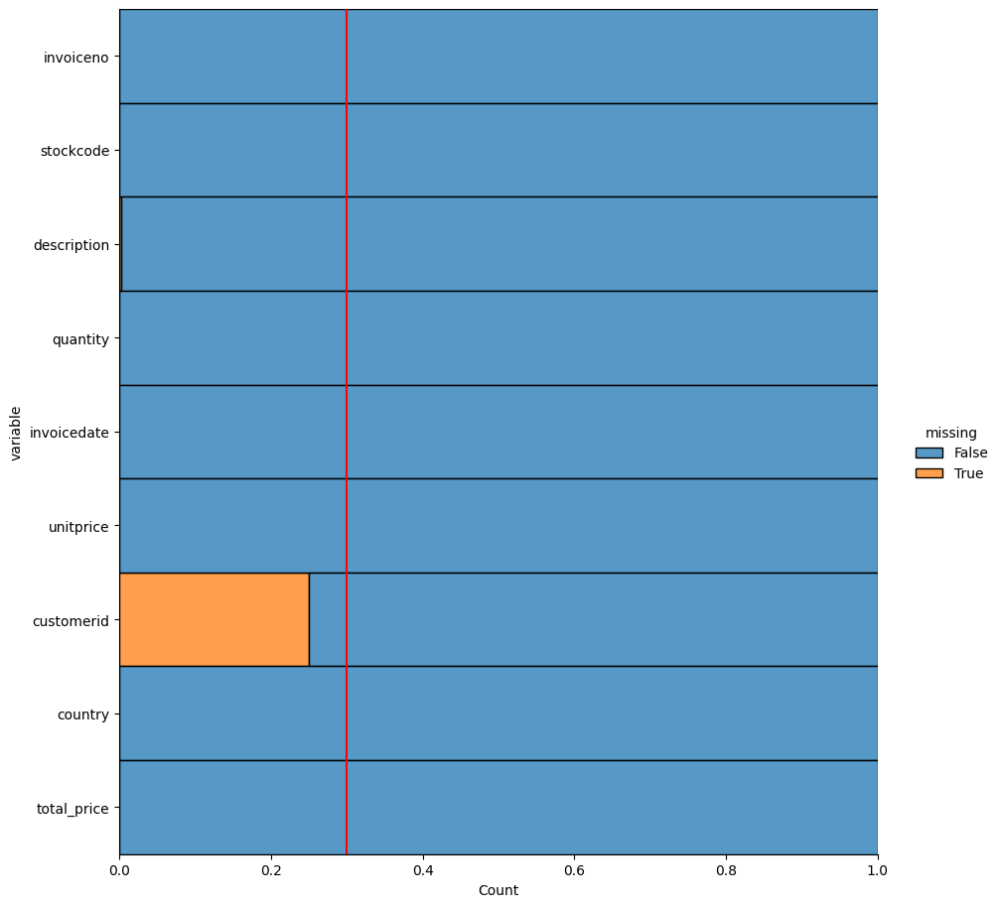

In [ ]:
plt.figure(figsize = (10, 5))

# Use seaborn's displot instead of plotly.express.displot
sns.displot(
    data = df.isnull().melt(value_name = "missing"),
    y = "variable",
    hue = "missing",
    multiple = "fill",
    height = 9.25)

plt.axvline(0.3, color = "r");

In [ ]:
print("There is", df.shape[0], "observation and", df.shape[1], "columns in the dataset")

There is 541909 observation and 9 columns in the dataset


In [ ]:
df.dropna(inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 406829 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   invoiceno    406829 non-null  object        
 1   stockcode    406829 non-null  object        
 2   description  406829 non-null  object        
 3   quantity     406829 non-null  int64         
 4   invoicedate  406829 non-null  datetime64[ns]
 5   unitprice    406829 non-null  float64       
 6   customerid   406829 non-null  object        
 7   country      406829 non-null  object        
 8   total_price  406829 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(5)
memory usage: 31.0+ MB


<Figure size 1000x500 with 0 Axes>

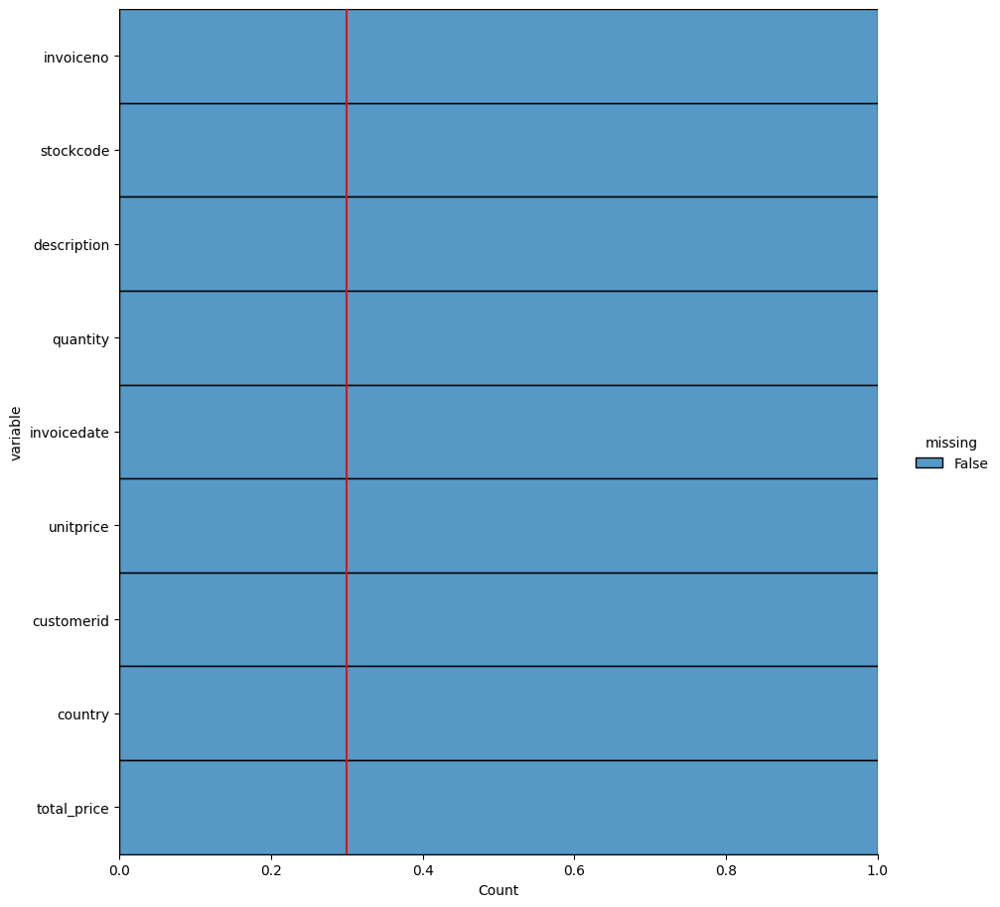

In [ ]:
plt.figure(figsize = (10, 5))

sns.displot(
    data = df.isnull().melt(value_name = "missing"),
    y = "variable",
    hue = "missing",
    multiple = "fill",
    height = 9.25)

plt.axvline(0.3, color = "r");

After dropping the missing values as mentioned above, we are left with 406,829 records, having removed 135,080 entries from the dataset. This indicates that the majority of the missing values were due to the absence of customerid, which accounts for 155,080 missing entries, subsequently affecting the description field with 1,454 missing values.

###iii. Detecting Duplicate Entries in The Dataset

In [ ]:
print("There are", df.duplicated(subset=None, keep='first').sum(), "duplicated observations in the dataset.")
print(df.duplicated(subset=None, keep='first').sum(), "Duplicated observations are dropped!")
df.drop_duplicates(keep='first', inplace=True)

There are 5225 duplicated observations in the dataset.
5225 Duplicated observations are dropped!


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 401604 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   invoiceno    401604 non-null  object        
 1   stockcode    401604 non-null  object        
 2   description  401604 non-null  object        
 3   quantity     401604 non-null  int64         
 4   invoicedate  401604 non-null  datetime64[ns]
 5   unitprice    401604 non-null  float64       
 6   customerid   401604 non-null  object        
 7   country      401604 non-null  object        
 8   total_price  401604 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(5)
memory usage: 30.6+ MB


###iv. Explorating The Orders

The remain data after dropping missing value and duplicate are 401604.

lets explore each feature in dataset

Invoice Number

In [ ]:
print("The Top Five INVOICENO According to TOTAL_PRICE :")
df.groupby(['invoiceno','customerid', 'country'])['total_price'].sum().sort_values(ascending=False).head()

The Top Five INVOICENO According to TOTAL_PRICE :


,,,total_price
invoiceno,customerid,country,
581483,16446.000,United Kingdom,168469.600
541431,12346.000,United Kingdom,77183.600
556444,15098.000,United Kingdom,38970.000
567423,17450.000,United Kingdom,31698.160
556917,12415.000,Australia,22775.930


In [ ]:
print("The Bottom Five INVOICENO According to TOTAL_PRICE :")
df.groupby(['invoiceno','customerid', 'country'])['total_price'].sum().sort_values(ascending=True).head()

The Bottom Five INVOICENO According to TOTAL_PRICE :


,,,total_price
invoiceno,customerid,country,
C581484,16446.000,United Kingdom,-168469.600
C541433,12346.000,United Kingdom,-77183.600
C556445,15098.000,United Kingdom,-38970.000
C550456,15749.000,United Kingdom,-22998.400
C570556,16029.000,United Kingdom,-9466.560


The invoiceno values of rows with a negative total price value begin with C.

In [ ]:
df['total_price'][df['total_price'] <= 0].value_counts().sum()

np.int64(8912)

There are 8912 Invoice Nomber with negative value and zero value that start with letter 'C' and 'A'. This mean the transaction was cancel, or return payment

so we drop invoice number with negative value from the dataset

###v. Get rid of Cancellations And Negative Values

To prepare the data for clustering, we removed cancelled transactions and any records with negative values in quantity, unit price, or total price. These values can distort analysis and do not reflect actual customer behavior.

In [ ]:
minus_trans = df[df['total_price'] <= 0].index
df.drop(minus_trans, inplace=True)

Quantity

In [ ]:
print("Number of Observations That QUANTITY Values Above 0")
df[df['quantity'] == 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

Number of Observations That QUANTITY Values Above 0


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country


Number of quantity that below and equal to 0 is null, due to elemination in missing data and duplicates

unitprice

In [ ]:
print("Number of Observations That UNITPRICE Values below and equal to 0")
df[df['unitprice'] <= 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']].head()

Number of Observations That UNITPRICE Values below and equal to 0


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country




Number of Unit Price that below and equal to 0 is null, due to elemination in missing data and duplicates


###vi. Lets Explore the Global Market

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 392692 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   invoiceno    392692 non-null  object        
 1   stockcode    392692 non-null  object        
 2   description  392692 non-null  object        
 3   quantity     392692 non-null  int64         
 4   invoicedate  392692 non-null  datetime64[ns]
 5   unitprice    392692 non-null  float64       
 6   customerid   392692 non-null  object        
 7   country      392692 non-null  object        
 8   total_price  392692 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(5)
memory usage: 30.0+ MB


Visualization Analysis

In [ ]:
print("Total number of invoices for each country :")
print(df.groupby('country')['invoiceno'].nunique().sort_values(ascending=False))

Total number of invoices for each country :
country
United Kingdom          16646
Germany                   457
France                    389
EIRE                      260
Belgium                    98
Netherlands                94
Spain                      90
Portugal                   57
Australia                  57
Switzerland                51
Finland                    41
Italy                      38
Sweden                     36
Norway                     36
Channel Islands            26
Japan                      19
Poland                     19
Denmark                    18
Austria                    17
Cyprus                     16
Unspecified                 8
Iceland                     7
Singapore                   7
Canada                      6
Greece                      5
Malta                       5
Israel                      5
USA                         5
Lithuania                   4
European Community          4
United Arab Emirates        3
Czech Republic    

In [ ]:
import plotly.io as pio
pio.renderers.default = 'colab'

In [ ]:
top_invoice = df.groupby('invoiceno')['total_price']
top_invoice.sum().sort_values(ascending=False).head(10)

,total_price
invoiceno,
581483,168469.600
541431,77183.600
556444,38970.000
567423,31698.160
556917,22775.930
572209,22206.000
567381,22104.800
563614,21880.440
550461,21535.900


In [ ]:
top_invoice2 = df.groupby(['invoiceno', 'invoicedate','customerid','country'])['total_price']
top2 = top_invoice2.sum().sort_values(ascending=False).head(10)

print('Top 10 Highest Invoice Amounts', '\n', top2)

Top 10 Highest Invoice Amounts 
 invoiceno  invoicedate          customerid  country       
581483     2011-12-09 09:15:00  16446.000   United Kingdom   168469.600
541431     2011-01-18 10:01:00  12346.000   United Kingdom    77183.600
556444     2011-06-10 15:28:00  15098.000   United Kingdom    38970.000
567423     2011-09-20 11:05:00  17450.000   United Kingdom    31698.160
556917     2011-06-15 13:37:00  12415.000   Australia         22775.930
572209     2011-10-21 12:08:00  18102.000   United Kingdom    22206.000
567381     2011-09-20 10:12:00  17450.000   United Kingdom    22104.800
563614     2011-08-18 08:51:00  12415.000   Australia         21880.440
550461     2011-04-18 13:20:00  15749.000   United Kingdom    21535.900
572035     2011-10-20 12:03:00  14646.000   Netherlands       20277.920
Name: total_price, dtype: float64


In [ ]:
top_country = df.groupby('country')['invoiceno'].nunique().sort_values(ascending=False).reset_index().head(10)
top_country.columns = ['country', 'invoice_count']
print('Top 10 Countries Based on Invoice Volume', '\n', top_country)

Top 10 Countries Based on Invoice Volume 
           country  invoice_count
0  United Kingdom          16646
1         Germany            457
2          France            389
3            EIRE            260
4         Belgium             98
5     Netherlands             94
6           Spain             90
7        Portugal             57
8       Australia             57
9     Switzerland             51


In [ ]:
fig = px.histogram(top_country, x='country', y='invoice_count',
             title='Top 10 Countries Based on Invoice Volume',
             labels={'country': 'Country', 'invoice_count': 'Number of Invoices'})
fig.show()

In [ ]:
top_description = df.groupby('description')['quantity'].count().sort_values(ascending=False).reset_index().head(10)
top_description.columns = ['description', 'quantity']
print('Top 10 Description Products With the Most Repeat Purchases', '\n', top_description)

Top 10 Description Products With the Most Repeat Purchases 
                           description  quantity
0  WHITE HANGING HEART T-LIGHT HOLDER      2016
1            REGENCY CAKESTAND 3 TIER      1713
2             JUMBO BAG RED RETROSPOT      1615
3       ASSORTED COLOUR BIRD ORNAMENT      1395
4                       PARTY BUNTING      1389
5             LUNCH BAG RED RETROSPOT      1303
6   SET OF 3 CAKE TINS PANTRY DESIGN       1152
7                             POSTAGE      1099
8             LUNCH BAG  BLACK SKULL.      1078
9     PACK OF 72 RETROSPOT CAKE CASES      1050


In [ ]:
fig = px.bar(top_description, x='description', y='quantity',
             title='Top 10 Description Products With the Most Repeat Purchases',
             labels={'description': 'Description of Product', 'quantity': 'Repeat Purchase'})
fig.show()

In [ ]:
top_quantity = df.groupby('description')['quantity'].sum().sort_values(ascending=False).reset_index().head(10)
top_quantity.columns = ['description', 'quantity']
print('Top 10 Products by Quantity Sold', '\n', top_quantity)

Top 10 Products by Quantity Sold 
                           description  quantity
0         PAPER CRAFT , LITTLE BIRDIE     80995
1      MEDIUM CERAMIC TOP STORAGE JAR     77916
2   WORLD WAR 2 GLIDERS ASSTD DESIGNS     54319
3             JUMBO BAG RED RETROSPOT     46078
4  WHITE HANGING HEART T-LIGHT HOLDER     36706
5       ASSORTED COLOUR BIRD ORNAMENT     35263
6     PACK OF 72 RETROSPOT CAKE CASES     33670
7                      POPCORN HOLDER     30919
8                  RABBIT NIGHT LIGHT     27153
9             MINI PAINT SET VINTAGE      26076


In [ ]:
fig = px.bar(top_quantity, x='description', y='quantity',
             title='Top 10 Products by Quantity Sold',
             labels={'description': 'Description of Product', 'quantity': 'Quantity Sold'})
fig.show()

In [ ]:
top_sales = df.groupby('description')['total_price'].sum().sort_values(ascending=False).reset_index().head(10)
top_sales.columns = ['description', 'total_price']
print('Top 10 Products with the Highest Sales', '\n', top_sales)

Top 10 Products with the Highest Sales 
                           description  total_price
0         PAPER CRAFT , LITTLE BIRDIE   168469.600
1            REGENCY CAKESTAND 3 TIER   142264.750
2  WHITE HANGING HEART T-LIGHT HOLDER   100392.100
3             JUMBO BAG RED RETROSPOT    85040.540
4      MEDIUM CERAMIC TOP STORAGE JAR    81416.730
5                             POSTAGE    77803.960
6                       PARTY BUNTING    68785.230
7       ASSORTED COLOUR BIRD ORNAMENT    56413.030
8                              Manual    53419.930
9                  RABBIT NIGHT LIGHT    51251.240


In [ ]:
fig = px.bar(top_sales, x='description', y='total_price',
             title='Top 10 Products with the Highest Sales',
             labels={'description': 'Description of Product', 'total_price': 'total_price'})
fig.show()

In [ ]:
cust_count = df.groupby('country')['customerid'].nunique().sort_values(ascending=False).reset_index()
cust_count.columns = ['Country', 'Customer_Count']
print('Number of Customers per Country', '\n', cust_count)

Number of Customers per Country 
                  Country  Customer_Count
0         United Kingdom            3920
1                Germany              94
2                 France              87
3                  Spain              30
4                Belgium              25
5            Switzerland              21
6               Portugal              19
7                  Italy              14
8                Finland              12
9                Austria              11
10                Norway              10
11             Australia               9
12               Denmark               9
13           Netherlands               9
14       Channel Islands               9
15                 Japan               8
16                Sweden               8
17                Cyprus               8
18                Poland               6
19           Unspecified               4
20                   USA               4
21                Canada               4
22                Greec

In [ ]:
cust2 = cust_count.head(10)
fig = px.bar(cust2, x='Country', y='Customer_Count',
             title='Top 10 Countries by Distinct Customer ID Count',
             labels={'Country': 'Country', 'Customer_Count': 'Number of Customers'})
fig.show()

In [ ]:
top_cust = df.groupby(['customerid','country'])['total_price']
top_cust2 = top_cust.sum().sort_values(ascending=False).head(20)

print('Top 20 Customer With the most Spending', '\n', top_cust2)

Top 20 Customer With the most Spending 
 customerid  country       
14646.000   Netherlands      280206.020
18102.000   United Kingdom   259657.300
17450.000   United Kingdom   194390.790
16446.000   United Kingdom   168472.500
14911.000   EIRE             143711.170
12415.000   Australia        124914.530
14156.000   EIRE             117210.080
17511.000   United Kingdom    91062.380
16029.000   United Kingdom    80850.840
12346.000   United Kingdom    77183.600
16684.000   United Kingdom    66653.560
14096.000   United Kingdom    65164.790
13694.000   United Kingdom    65039.620
15311.000   United Kingdom    60632.750
13089.000   United Kingdom    58762.080
17949.000   United Kingdom    58510.480
15769.000   United Kingdom    56252.720
15061.000   United Kingdom    54534.140
14298.000   United Kingdom    51527.300
14088.000   United Kingdom    50491.810
Name: total_price, dtype: float64


In [ ]:
sum_country = df.groupby('country')['total_price'].sum().sort_values(ascending=False).reset_index().head(10)
sum_country.columns = ['country', 'total_price']
print('Top 10 Countries With the Highest Sales', '\n', sum_country)

Top 10 Countries With the Highest Sales 
           country  total_price
0  United Kingdom  7285024.644
1     Netherlands   285446.340
2            EIRE   265262.460
3         Germany   228678.400
4          France   208934.310
5       Australia   138453.810
6           Spain    61558.560
7     Switzerland    56443.950
8         Belgium    41196.340
9          Sweden    38367.830


In [ ]:
fig = px.bar(sum_country, x='country', y='total_price',
             title='Top 10 Countries With the Highest Sales')
fig.show()

In [ ]:
fig = px.bar(sum_country, x='country', y='total_price',
             title='Top 10 Countries With the Highest Sales')
fig.show()

In [ ]:
print('First date of Invoice: ', df['invoicedate'].min(), ', and Last date of Invoice Date :', df['invoicedate'].max())

First date of Invoice:  2010-12-01 08:26:00 , and Last date of Invoice Date : 2011-12-09 12:50:00


In [ ]:
df_sales = df.copy()
df_sales['invoicedate'] = pd.to_datetime(df['invoicedate'])
df_sales['YearMonth'] = df['invoicedate'].dt.to_period('M')
df_sales['total_amount'] = df['quantity'] * df['unitprice']
df_sales['quantity'] > 0

monthly_sales = df_sales.groupby(df_sales['YearMonth']).agg(
    total_quantity=('quantity', 'sum'),
    total_amount=('total_amount', 'sum')).reset_index()

monthly_sales

,YearMonth,total_quantity,total_amount
0,2010-12,311048,570422.730
1,2011-01,348473,568101.310
2,2011-02,265027,446084.920
3,2011-03,347582,594081.760
4,2011-04,291366,468374.331
5,2011-05,372864,677355.150
6,2011-06,363014,660046.050
7,2011-07,367360,598962.901
8,2011-08,397373,644051.040
9,2011-09,543652,950690.202


In [ ]:
monthly_sales['YearMonth'] = monthly_sales['YearMonth'].astype(str)

fig = px.bar(monthly_sales, x='YearMonth', y='total_amount', title='Monthly Total Sales and Quantity Sold')
fig.add_scatter(x=monthly_sales['YearMonth'], y=monthly_sales['total_quantity'], mode='lines', name='Total Quantity Sold', yaxis='y2')

fig.update_layout(
    yaxis=dict(
        title='Total Sales ($)',
        titlefont=dict(
            color="#1f77b4"),
        tickfont=dict(
            color="#1f77b4")),
    yaxis2=dict(
        title='Total Quantity Sold',
        titlefont=dict(
            color="#ff7f0e"),
        tickfont=dict(
            color="#ff7f0e"),
        overlaying='y',
        side='right'),
    xaxis_title="Month" )

fig.show()

- Key Insight

1. Stable Performance in First Half (Jan–Jul 2011):
  * Sales and quantity show moderate fluctuations with no strong upward or downward trend.

  * Total sales hover around $500k–$700k, while quantity sold remains between 250k–350k units.

2. Significant Growth Phase (Aug–Nov 2011):

  * Starting August, both sales and quantity rise sharply.

  * November 2011 marks the peak, with sales reaching ~$1.2M and quantity ~670k+ units.

  * Likely driven by seasonal demand, campaigns, or holiday season effects (e.g., pre-Christmas).

3. Drop in December 2011:

  * A sudden decline occurs in both metrics.

  * Could indicate end of peak season, fewer working days, or inventory limitations.



* Conclusion:

- There is a strong correlation between quantity sold and total sales.

- The last quarter of the year (especially Sept–Nov) is the most critical period for sales.

### vii. Basket Size and Average Order Value (AOV)

Basket size refers to the total quantity or value of items purchased in a single transaction or by a customer over time. In clustering analysis, basket size is a valuable feature for understanding customer purchasing behavior. It helps distinguish between high-volume buyers and occasional shoppers, allowing clusters to capture differences in customer value and shopping patterns. By including basket size in clustering, businesses can better segment customers for targeted marketing, upselling strategies, and personalized offers.


In [ ]:
# GROUP BY Invoice
basket_stats = df.groupby('invoiceno').agg({
    'quantity': 'sum',
    'total_price': 'sum'
}).reset_index()

# Basket Size: average quantity per Invoice
basket_size = basket_stats['quantity'].mean()

# Average Order Value (AOV)
aov = basket_stats['total_price'].mean()

print(f"🧺 Average Basket Size: {basket_size:.2f} items/invoice")
print(f"💰 Average Order Value (AOV): {aov:.2f} currency units/invoice")

🧺 Average Basket Size: 278.01 items/invoice
💰 Average Order Value (AOV): 479.56 currency units/invoice


On average, each invoice contains 278 items, which suggests customers often purchase in bulk. This could indicate:

- A B2B or wholesale purchasing pattern

- Promotions encouraging high-volume buys

- Products that are sold in sets or small-value items (e.g., stationery, home goods)

Moderate AOV (Average Order Value)
Each transaction yields ~480 in currency, which when compared with the high basket size, suggests that:

- The average item price is relatively low (~1.7 currency units per item: 479.56 / 278.01)

- Most transactions are high-volume, low-margin



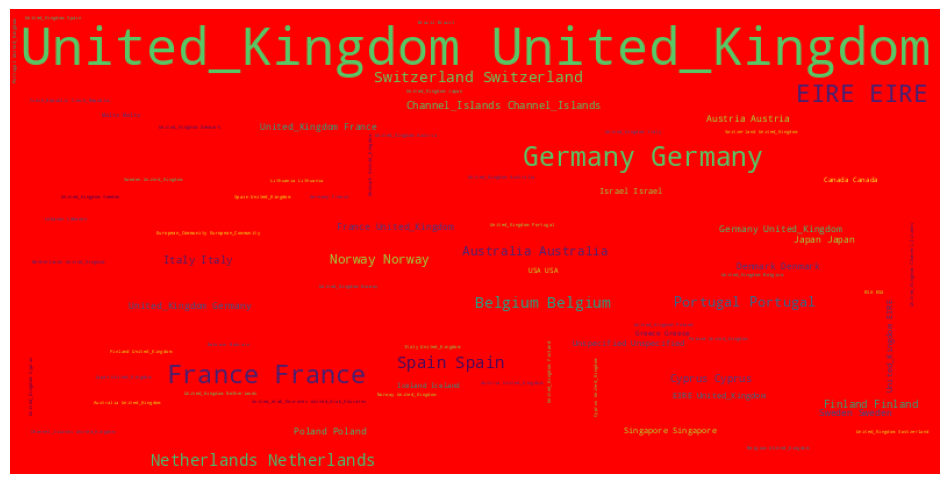

In [ ]:
country_text = df["country"].str.split(" ").str.join("_")
all_countries = " ".join(country_text)

wc = WordCloud(background_color="red",
               max_words=250,
               max_font_size=256,
               random_state=42,
               width=800, height=400)
wc.generate(all_countries)
plt.figure(figsize = (12, 10))
plt.imshow(wc)
plt.axis('off')
plt.show()

The UK not only has the most sales revenue, but also the most customers. Since the majority of this data set contains orders from the UK, we can explore the UK market further by finding out what products the customers buy together and any other buying behaviors to improve our sales and targeting strategy.¶


### viii. Explore the UK Market


1. Create df_uk DataFrame

In [ ]:
df_uk = df[df["country"]=="United Kingdom"]
df_uk.head(3)

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000


In [ ]:
review(df_uk)
duplicate_values(df_uk)

Shape:(349203, 9)
****************************************************************************************************
Info:

<class 'pandas.core.frame.DataFrame'>
Index: 349203 entries, 0 to 541893
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   invoiceno    349203 non-null  object        
 1   stockcode    349203 non-null  object        
 2   description  349203 non-null  object        
 3   quantity     349203 non-null  int64         
 4   invoicedate  349203 non-null  datetime64[ns]
 5   unitprice    349203 non-null  float64       
 6   customerid   349203 non-null  object        
 7   country      349203 non-null  object        
 8   total_price  349203 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(5)
memory usage: 26.6+ MB
None
****************************************************************************************************
Number of Uniques:
invoiceno   

1. What are the most popular products that are bought in the UK?

In [ ]:
uk_quantity = df_uk.groupby('description')['quantity'].sum().sort_values(ascending=False).reset_index().head(10)
uk_quantity.columns = ['description', 'quantity']
print('Top 10 High-Demand Products in the UK Based on Quantity Sold', '\n', uk_quantity)

Top 10 High-Demand Products in the UK Based on Quantity Sold 
                           description  quantity
0         PAPER CRAFT , LITTLE BIRDIE     80995
1      MEDIUM CERAMIC TOP STORAGE JAR     76919
2   WORLD WAR 2 GLIDERS ASSTD DESIGNS     49086
3             JUMBO BAG RED RETROSPOT     41878
4  WHITE HANGING HEART T-LIGHT HOLDER     34630
5       ASSORTED COLOUR BIRD ORNAMENT     32628
6                      POPCORN HOLDER     28923
7          PACK OF 12 LONDON TISSUES      24321
8                 BROCADE RING PURSE      22675
9     PACK OF 72 RETROSPOT CAKE CASES     22442


In [ ]:
fig = px.histogram(uk_quantity, x='description', y='quantity',
             title='Top 10 High-Demand Products in the UK Based on Quantity Sold',
             labels={'description': 'Description of Product', 'quantity': 'Quantity Sold'})
fig.show()

In [ ]:
uk_demand = df_uk.groupby('description')['total_price'].sum().sort_values(ascending=False).reset_index().head(10)
uk_demand.columns = ['description', 'total_price']
print('Top 10 UK Products with Highest Sales ', '\n', uk_demand)

Top 10 UK Products with Highest Sales  
                           description  total_price
0         PAPER CRAFT , LITTLE BIRDIE   168469.600
1            REGENCY CAKESTAND 3 TIER   110713.000
2  WHITE HANGING HEART T-LIGHT HOLDER    94805.500
3      MEDIUM CERAMIC TOP STORAGE JAR    80291.440
4             JUMBO BAG RED RETROSPOT    77191.330
5                       PARTY BUNTING    63050.280
6       ASSORTED COLOUR BIRD ORNAMENT    52228.680
7                       CHILLI LIGHTS    45483.910
8     PAPER CHAIN KIT 50'S CHRISTMAS     40392.080
9      PICNIC BASKET WICKER 60 PIECES    39619.500


In [ ]:
fig = px.histogram(uk_demand, x='description', y='total_price',
             title='Top 10 UK Products with Highest Sales ',
             labels={'description': 'Description of Product', 'total_price': 'Total Sales'})
fig.show()

In [ ]:
uk_customer = df_uk.groupby('customerid')['total_price'].sum().sort_values(ascending=False).reset_index().head(10)
uk_customer.columns = ['customerid', 'total_price']
print('Top 10 UK Customers with the Most Spending ', '\n', uk_customer)

Top 10 UK Customers with the Most Spending  
    customerid  total_price
0   18102.000   259657.300
1   17450.000   194390.790
2   16446.000   168472.500
3   17511.000    91062.380
4   16029.000    80850.840
5   12346.000    77183.600
6   16684.000    66653.560
7   14096.000    65164.790
8   13694.000    65039.620
9   15311.000    60632.750


In [ ]:
uk_customer

,customerid,total_price
0,18102.000,259657.300
1,17450.000,194390.790
2,16446.000,168472.500
3,17511.000,91062.380
4,16029.000,80850.840
5,12346.000,77183.600
6,16684.000,66653.560
7,14096.000,65164.790
8,13694.000,65039.620
9,15311.000,60632.750


Top 10 UK Customers With the Most Spending


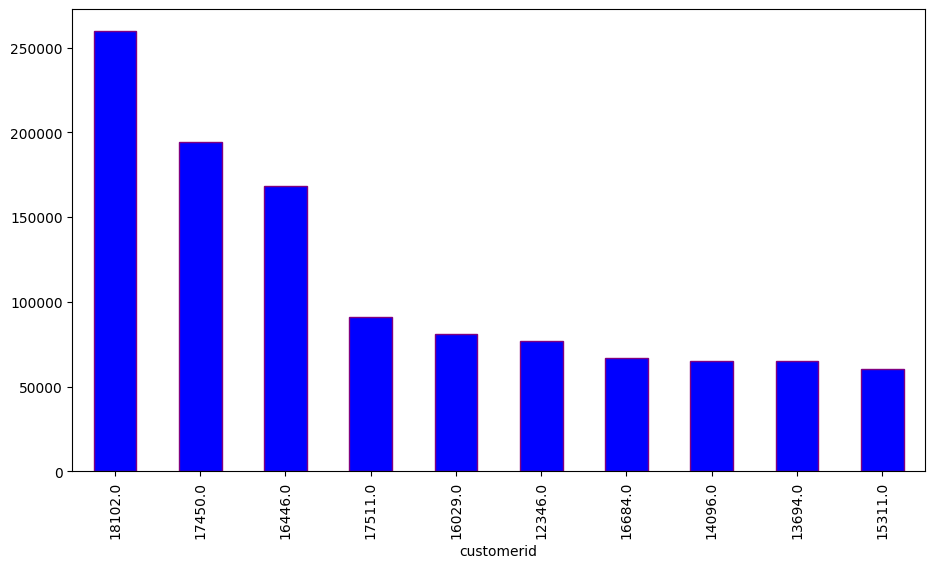

In [ ]:
print('Top 10 UK Customers With the Most Spending')
df_uk.groupby("customerid")['total_price'].sum().sort_values(ascending=False).head(10).plot(kind="bar", width=0.5, color='blue', edgecolor='purple', figsize=(11,6));

We will continue analyzing the UK transactions with customer segmentation.

# RFM Analysis

- Follow the steps below

   *i. Import Libraries*
   
   *ii. Review "df_uk" DataFrame*
   
   *iii. Calculate Recency*
   
   *iv. Calculate Frequency*
   
   *v. Calculate Monetary Values*
   
   *vi. Create RFM Table*



**[RFM](https://www.putler.com/rfm-analysis/) (Recency, Frequency, Monetary) Analysis** is a customer segmentation technique for analyzing customer value based on past buying behavior. RFM analysis was first used by the direct mail industry more than four decades ago, yet it is still an effective way to optimize our marketing.
<br>
<br>
Our goal in this Notebook is to cluster the customers in our data set to:
 - Recognize who are our most valuable customers
 - Increase revenue
 - Increase customer retention
 - Learn more about the trends and behaviors of our customers
 - Define customers that are at risk

We will start with **RFM Analysis** and then compliment our findings with predictive analysis using **K-Means Clustering Algorithms.**

- RECENCY (R): Time since last purchase
- FREQUENCY (F): Total number of purchases
- MONETARY VALUE (M): Total monetary value




Benefits of RFM Analysis

- Increased customer retention
- Increased response rate
- Increased conversion rate
- Increased revenue

RFM Analysis answers the following questions:
 - Who are our best customers?
 - Who has the potential to be converted into more profitable customers?
 - Which customers do we need to retain?
 - Which group of customers is most likely to respond to our marketing campaign?


### i. Import Libraries

In [ ]:
import datetime as dt
from datetime import datetime
import datetime as dt

### ii. Review df_uk DataFrame

In [ ]:
df_uk.info()

<class 'pandas.core.frame.DataFrame'>
Index: 349203 entries, 0 to 541893
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   invoiceno    349203 non-null  object        
 1   stockcode    349203 non-null  object        
 2   description  349203 non-null  object        
 3   quantity     349203 non-null  int64         
 4   invoicedate  349203 non-null  datetime64[ns]
 5   unitprice    349203 non-null  float64       
 6   customerid   349203 non-null  object        
 7   country      349203 non-null  object        
 8   total_price  349203 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(5)
memory usage: 26.6+ MB


In [ ]:
print("There is", df_uk.shape[0], "observation and", df_uk.shape[1], "columns in the dataset")

There is 349203 observation and 9 columns in the dataset


### iii. Recency: Days since last purchase
To calculate the recency values, follow these steps in order:

1. To calculate recency, we need to choose a date as a point of reference to evaluate how many days ago was the customer's last purchase.
2. Create a new column called Date which contains the invoice date without the timestamp
3. Group by CustomerID and check the last date of purchase
4. Calculate the days since last purchase
5. Drop Last_Purchase_Date since we don't need it anymore
6. Plot RFM distributions

1. Choose a date as a point of reference to evaluate how many days ago was the customer's last purchase.

In [ ]:
df_uk["ref_date"] = pd.to_datetime(df_uk['invoicedate']).dt.date.max()
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09


In [ ]:
df_uk['ref_date'] = pd.to_datetime(df_uk['ref_date'])

2. Create a new column called Date which contains the invoice date without the timestamp

In [ ]:
df_uk["date"] = pd.to_datetime(df_uk["invoicedate"]).dt.date
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01


In [ ]:
df_uk['date'] = pd.to_datetime(df_uk['date'])

3. Group by CustomerID and check the last date of purchase

In [ ]:
df_uk.groupby('customerid')[['date']].max().sample(5)

,date
customerid,
15808.000,2011-02-06
14481.000,2011-06-28
17888.000,2011-11-18
17370.000,2011-09-28
16966.000,2011-12-01


In [ ]:
df_uk['last_purchase_date'] = df_uk.groupby('customerid')['invoicedate'].transform(max)
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,last_purchase_date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,2010-12-02 15:27:00
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02 15:27:00
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,2010-12-02 15:27:00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02 15:27:00
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02 15:27:00


In [ ]:
df_uk['last_purchase_date'] = pd.to_datetime(df_uk['last_purchase_date']).dt.date
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,last_purchase_date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,2010-12-02
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,2010-12-02
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02


In [ ]:
df_uk['last_purchase_date'] = pd.to_datetime(df_uk['last_purchase_date'])

In [ ]:
df_uk.info()

<class 'pandas.core.frame.DataFrame'>
Index: 349203 entries, 0 to 541893
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   invoiceno           349203 non-null  object        
 1   stockcode           349203 non-null  object        
 2   description         349203 non-null  object        
 3   quantity            349203 non-null  int64         
 4   invoicedate         349203 non-null  datetime64[ns]
 5   unitprice           349203 non-null  float64       
 6   customerid          349203 non-null  object        
 7   country             349203 non-null  object        
 8   total_price         349203 non-null  float64       
 9   ref_date            349203 non-null  datetime64[ns]
 10  date                349203 non-null  datetime64[ns]
 11  last_purchase_date  349203 non-null  datetime64[ns]
dtypes: datetime64[ns](4), float64(2), int64(1), object(5)
memory usage: 34.6+ MB


In [ ]:
df_uk.groupby('customerid')[['last_purchase_date']].max().sample(5)

,last_purchase_date
customerid,
15754.000,2011-10-19
14247.000,2011-03-06
15847.000,2011-11-01
15075.000,2011-09-23
15341.000,2011-09-20


4. Calculate the days since last purchase

In [ ]:
df_uk.groupby('customerid')[['last_purchase_date']].max().sample(5)

,last_purchase_date
customerid,
16362.000,2011-11-07
16054.000,2011-07-17
13366.000,2011-10-20
17409.000,2011-06-08
18113.000,2010-12-06


In [ ]:
df_uk["customer_recency"] = df_uk["ref_date"] - df_uk["last_purchase_date"]
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,last_purchase_date,customer_recency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,2010-12-02,372 days
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,2010-12-02,372 days
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days


In [ ]:
df_uk['recency'] = pd.to_numeric(df_uk['customer_recency'].dt.days.astype('int64'))
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,last_purchase_date,customer_recency,recency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,2010-12-02,372 days,372
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days,372
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,2010-12-02,372 days,372
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days,372
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days,372


In [ ]:
customer_recency = pd.DataFrame(df_uk.groupby('customerid')['recency'].min())
customer_recency.rename(columns={'recency':'recency'}, inplace=True)
customer_recency.reset_index(inplace=True)
customer_recency.sample(5)

,customerid,recency
1500,14953.000,25
2621,16475.000,88
24,12842.000,70
1895,15484.000,1
2949,16926.000,371


5. Drop Last_Purchase_Date since we don't need it anymore

In [ ]:
print("There is", df_uk.shape[0], "observation and", df_uk.shape[1], "columns in the dataset")

There is 349203 observation and 14 columns in the dataset


In [ ]:
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,last_purchase_date,customer_recency,recency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,2010-12-02,372 days,372
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days,372
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,2010-12-02,372 days,372
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days,372
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,2010-12-02,372 days,372


In [ ]:
df_uk.drop('last_purchase_date', axis=1, inplace=True)
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,customer_recency,recency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,372 days,372
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,372 days,372
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372


6. Plot RFM distributions

In [ ]:
fig = px.histogram(df_uk, x = 'recency', title = 'Customer Recency Distribution')
fig.show()

### iv. Frequency: Number of purchases

To calculate how many times a customer purchased something, we need to count how many invoices each customer has. To calculate the frequency values, follow these steps in order:

1. Make a copy of df_uk and drop duplicates

In [ ]:
df_uk1 = df_uk.copy()
df_uk1.head()

NameError: name 'df_uk' is not defined

In [ ]:
duplicate_values(df_uk1)

Duplicate check...
There are 0 duplicated observations in the dataset.


2. Calculate the frequency of purchases

In [ ]:
customer_frequency = pd.DataFrame(df_uk.groupby('customerid')['invoiceno'].nunique())
customer_frequency.rename(columns={'invoiceno':'frequency'}, inplace=True)
customer_frequency.reset_index(inplace=True)
customer_frequency.sample(5)

,customerid,frequency
2824,16758.000,1
372,13332.000,1
3112,17160.000,6
2784,16711.000,5
2305,16043.000,4


In [ ]:
df_uk['customer_frequency'] = df_uk.groupby('customerid')['invoiceno'].transform('count')
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,customer_recency,recency,customer_frequency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,372 days,372,297
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,372 days,372,297
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297


3. Plot RFM distributions

In [ ]:
fig = px.histogram(df_uk, x = 'customer_frequency', title = 'Customer Frequency Distribution')
fig.show()

### V. Monetary: Total amount of money spent

The monetary value is calculated by adding together the cost of the customers' purchases.


1. Calculate sum total cost by customers and named "Monetary"

In [ ]:
customer_monetary = pd.DataFrame(df_uk.groupby('customerid')['total_price'].sum())
customer_monetary.rename(columns={'total_price':'monetary'}, inplace=True)
customer_monetary.reset_index(inplace=True)
customer_monetary.sample(5)

,customerid,monetary
1998,15621.000,1293.030
48,12881.000,298.000
1095,14375.000,235.560
3501,17703.000,798.740
633,13711.000,252.060


In [ ]:
df_uk['customer_monetary'] = df_uk.groupby('customerid')['total_price'].transform('sum')
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,customer_recency,recency,customer_frequency,customer_monetary
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,372 days,372,297,5391.210
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297,5391.210
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,372 days,372,297,5391.210
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297,5391.210
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297,5391.210


2. Plot RFM distributions

In [ ]:
fig = px.histogram(df_uk, x = 'customer_monetary', title = 'Customer Monetary Distribution')
fig.show()

### vi. Create RFM Table
Merge the recency, frequency and motetary dataframes

In [ ]:
customer_rfm = pd.merge(pd.merge(customer_recency, customer_frequency, on='customerid'), customer_monetary, on='customerid')
customer_rfm.head()

,customerid,recency,frequency,monetary
0,12346.000,325,1,77183.600
1,12747.000,2,11,4196.010
2,12748.000,0,209,33053.190
3,12749.000,3,5,4090.880
4,12820.000,3,4,942.340


In [ ]:
customer_rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3920 entries, 0 to 3919
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   customerid  3920 non-null   float64
 1   recency     3920 non-null   int64  
 2   frequency   3920 non-null   int64  
 3   monetary    3920 non-null   float64
dtypes: float64(2), int64(2)
memory usage: 122.6 KB


In [ ]:
missing_values(customer_rfm)

,Missing_Number,Missing_Percent


In [ ]:
duplicate_values(customer_rfm)

Duplicate check...
There are 0 duplicated observations in the dataset.


# Customer Segmentation with RFM Scores

- Calculate RFM Scoring



- Plot RFM Segments

Businesses have this ever-lasting urge to understand their customers. The better you understand the customer, the better you serve them, and the higher the financial gain you receive from that customer. Since the dawn of trade, this process of understanding customers for a strategic gain has been there practiced and this task is known majorly as [Customer Segmentation](https://clevertap.com/blog/rfm-analysis/).
Well as the name suggests, Customer Segmentation could segment customers according to their precise needs. Some of the common ways of segmenting customers are based on their Recency-Frequency-Monatory values, their demographics like gender, region, country, etc, and some of their business-crafted scores. We will use Recency-Frequency-Monatory values for this case.

In this section, we will create an RFM Segmentation Table where we segment our customers by using the RFM table. For example, we can label the best customer as "Big Spenders" and the lost customer as "Lost Customer".

## Calculate RFM Scoring

The simplest way to create customer segments from an RFM model is by using **Quartiles**. We will assign a score from 1 to 4 to each category (Recency, Frequency, and Monetary) with 4 being the highest/best value. The final RFM score is calculated by combining all RFM values. For Customer Segmentation, we will use the df_rfm data set resulting from the RFM analysis.
<br>
<br>
**Note**: Data can be assigned into more groups for better granularity, but we will use 4 in this case.

1. Divide the df_rfm into quarters

In [ ]:
customer_rfm.set_index('customerid', inplace = True)
customer_rfm.sample(5)

,recency,frequency,monetary
customerid,,,
16416.000,26,3,1051.400
17019.000,11,4,1258.080
17397.000,22,2,681.410
13607.000,40,1,675.510
18257.000,39,8,2337.630


In [ ]:
quantiles = customer_rfm.quantile(q = [0.25,0.50,0.75])
quantiles

,recency,frequency,monetary
0.250,17.000,1.000,298.185
0.500,50.000,2.000,644.975
0.750,142.000,5.000,1571.285


### Creating the RFM Segmentation Table


1. Create two functions, one for Recency and one for Frequency and Monetary. For Recency, customers in the first quarter should be scored as 4, this represents the highest Recency value. Conversely, for Frequency and Monetary, customers in the last quarter should be scored as 4, representing the highest Frequency and Monetary values.

In [ ]:
def rec_score(x):
    if x < 17.000:
        return 4
    elif 17.000 <= x < 50.000:
        return 3
    elif 50.000 <= x < 142.000:
        return 2
    else:
        return 1

In [ ]:
def freq_score(x):
    if x > 5.000:
        return 4
    elif 5.000 >= x > 2.000:
        return 3
    elif 2.000 >= x > 1:
        return 2
    else:
        return 1

In [ ]:
def mon_score(x):
    if x > 1571.285:
        return 4
    elif 1571.285 >= x > 644.975:
        return 3
    elif 644.975 >= x > 298.185:
        return 2
    else:
        return 1

2. Score customers from 1 to 4 by applying the functions we have created. Also create separate score column for each value.

In [ ]:
customer_rfm['recency_score'] = customer_rfm['recency'].apply(rec_score)
customer_rfm['frequency_score'] = customer_rfm['frequency'].apply(freq_score)
customer_rfm['monetary_score'] = customer_rfm['monetary'].apply(mon_score)

customer_rfm.sample(5)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score
customerid,,,,,,
13296.000,137,1,87.400,2,1,1
13349.000,10,1,247.320,4,1,1
17392.000,306,2,417.270,1,2,2
15412.000,171,1,190.530,1,1,1
15206.000,10,4,420.300,4,3,2


In [ ]:
customer_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3920 entries, 12346.0 to 18287.0
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   recency          3920 non-null   int64  
 1   frequency        3920 non-null   int64  
 2   monetary         3920 non-null   float64
 3   recency_score    3920 non-null   int64  
 4   frequency_score  3920 non-null   int64  
 5   monetary_score   3920 non-null   int64  
dtypes: float64(1), int64(5)
memory usage: 214.4 KB


In [ ]:
recency_score_counts = customer_rfm['recency_score'].value_counts().reset_index()
recency_score_counts.columns = ['recency_score', 'count']

fig = px.pie(recency_score_counts,
             values='count',
             names='recency_score',
             title='Recency Score Distribution')
fig.show()

In [ ]:
frequency_score_counts = customer_rfm['frequency_score'].value_counts().reset_index()
frequency_score_counts.columns = ['frequency_score', 'count']

fig = px.pie(frequency_score_counts,
             values='count',
             names='frequency_score',
             title='Frequency_Score Distribution')
fig.show()

In [ ]:
monetary_score_counts = customer_rfm['monetary_score'].value_counts().reset_index()
monetary_score_counts.columns = ['monetary_score', 'count']

fig = px.pie(monetary_score_counts,
             values='count',
             names='monetary_score',
             title='Monetary_Score Distribution')
fig.show()

3. Now that scored each customer, we'll combine the scores for segmentation.

In [ ]:
customer_rfm['RFM_score'] = (customer_rfm['recency_score'].astype(str) + customer_rfm['frequency_score'].astype(str) +
                            customer_rfm['monetary_score'].astype(str))
customer_rfm.sample(5)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_score
customerid,,,,,,,
15448.000,312,1,494.640,1,1,2,112
16205.000,30,4,757.630,3,3,3,333
15807.000,50,3,903.900,2,3,3,233
16247.000,170,1,114.560,1,1,1,111
12823.000,74,5,1759.500,2,3,4,234


In [ ]:
customer_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3920 entries, 12346.0 to 18287.0
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   recency          3920 non-null   int64  
 1   frequency        3920 non-null   int64  
 2   monetary         3920 non-null   float64
 3   recency_score    3920 non-null   int64  
 4   frequency_score  3920 non-null   int64  
 5   monetary_score   3920 non-null   int64  
 6   RFM_score        3920 non-null   object 
dtypes: float64(1), int64(5), object(1)
memory usage: 245.0+ KB


In [ ]:
customer_rfm['RFM_score'].value_counts()

,count
RFM_score,
444,402
111,396
112,214
333,203
211,189
344,182
233,145
212,145
433,141


In [ ]:
fig = px.histogram(customer_rfm, x = customer_rfm['RFM_score'].value_counts().index,
                   y = customer_rfm['RFM_score'].value_counts().values,
                   title = 'Customer_RFM Distribution',
                   labels = dict(x = "RFM_score", y ="counts"))
fig.show()

4. Define rfm_level function that tags customers by using RFM_Scrores and Create a new variable RFM_Level

In [ ]:
customer_rfm['RFM_level'] = customer_rfm['recency_score'] + customer_rfm['frequency_score'] + customer_rfm['monetary_score']
customer_rfm.sample(5)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_score,RFM_level
customerid,,,,,,,,
15291.000,25,15,4668.300,3,4,4,344,11
17682.000,10,6,2474.330,4,4,4,444,12
17836.000,47,1,110.210,3,1,1,311,5
17203.000,35,6,3560.080,3,4,4,344,11
15469.000,50,2,538.550,2,2,2,222,6


In [ ]:
customer_rfm['RFM_level'].value_counts()

,count
RFM_level,
4,460
5,458
9,415
6,402
12,402
3,396
7,369
8,368
10,337


In [ ]:
print('Min value for RFM_level : ', customer_rfm['RFM_level'].min())
print('Max value for RFM_level : ', customer_rfm['RFM_level'].max())

Min value for RFM_level :  3
Max value for RFM_level :  12


In [ ]:
np.sort(customer_rfm['RFM_level'].unique())

array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [ ]:
customer_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3920 entries, 12346.0 to 18287.0
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   recency          3920 non-null   int64  
 1   frequency        3920 non-null   int64  
 2   monetary         3920 non-null   float64
 3   recency_score    3920 non-null   int64  
 4   frequency_score  3920 non-null   int64  
 5   monetary_score   3920 non-null   int64  
 6   RFM_score        3920 non-null   object 
 7   RFM_level        3920 non-null   int64  
dtypes: float64(1), int64(6), object(1)
memory usage: 275.6+ KB


In [ ]:
rfm_level_counts = customer_rfm['RFM_level'].value_counts().reset_index()
rfm_level_counts.columns = ['RFM_level', 'count']

fig = px.pie(rfm_level_counts,
             values = 'count',
             names = 'RFM_level',
             title = 'RFM_level Distribution')
fig.show()

5. Calculate average values for each RFM_Level, and return a size of each segment

In [ ]:
def segments(df_rfm):
    if df_rfm['RFM_level'] >= 10:
        return 'champion_loyal_customer'
    elif df_rfm['RFM_level'] >= 8:
        return 'promising'
    elif df_rfm['RFM_level'] >= 6:
        return 'need_attention'
    else:
        return 'almost_lost'

In [ ]:
customer_rfm['customer_segment'] = customer_rfm.apply(segments,axis=1)
customer_rfm.sample(5)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_score,RFM_level,customer_segment
customerid,,,,,,,,,
14965.000,96,2,596.090,2,2,2,222,6,need_attention
16469.000,23,4,625.420,3,3,2,332,8,promising
15674.000,73,5,2446.600,2,3,4,234,9,promising
13888.000,119,2,595.670,2,2,2,222,6,need_attention
16456.000,99,5,2158.180,2,3,4,234,9,promising


In [ ]:
customer_rfm['customer_segment'].value_counts()

,count
customer_segment,
almost_lost,1314
champion_loyal_customer,1052
promising,783
need_attention,771


In [ ]:
customer_rfm['customer_segment'].value_counts(dropna=False, normalize=True)

,proportion
customer_segment,
almost_lost,0.335
champion_loyal_customer,0.268
promising,0.200
need_attention,0.197


In [ ]:
customer_rfm[customer_rfm['customer_segment'] == 'champion_loyal_customer'].sample(5)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_score,RFM_level,customer_segment
customerid,,,,,,,,,
15969.000,2,3,666.100,4,3,3,433,10,champion_loyal_customer
17364.000,0,11,4462.680,4,4,4,444,12,champion_loyal_customer
14298.000,8,44,51527.300,4,4,4,444,12,champion_loyal_customer
14071.000,3,8,1437.570,4,4,3,443,11,champion_loyal_customer
14409.000,71,6,2059.450,2,4,4,244,10,champion_loyal_customer


In [ ]:
customer_rfm[customer_rfm['customer_segment'] == 'promising'].sample(5)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_score,RFM_level,customer_segment
customerid,,,,,,,,,
16120.000,59,4,1309.140,2,3,3,233,8,promising
13136.000,56,5,2607.610,2,3,4,234,9,promising
16930.000,26,3,378.890,3,3,2,332,8,promising
15067.000,78,3,1744.760,2,3,4,234,9,promising
15704.000,140,4,2293.620,2,3,4,234,9,promising


In [ ]:
customer_rfm[customer_rfm['customer_segment'] == 'need_attention'].sample(5)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_score,RFM_level,customer_segment
customerid,,,,,,,,,
14346.000,120,2,1021.580,2,2,3,223,7,need_attention
15184.000,29,2,402.200,3,2,2,322,7,need_attention
17913.000,58,2,408.650,2,2,2,222,6,need_attention
13606.000,29,3,276.750,3,3,1,331,7,need_attention
14176.000,297,4,576.900,1,3,2,132,6,need_attention


In [ ]:
customer_rfm[customer_rfm['customer_segment'] == 'almost_lost'].sample(5)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_score,RFM_level,customer_segment
customerid,,,,,,,,,
17601.000,239,1,116.010,1,1,1,111,3,almost_lost
13581.000,309,1,118.000,1,1,1,111,3,almost_lost
16148.000,296,1,76.320,1,1,1,111,3,almost_lost
18033.000,65,1,93.820,2,1,1,211,4,almost_lost
14886.000,252,1,364.800,1,1,2,112,4,almost_lost


In [ ]:
fig = px.histogram(customer_rfm, x = customer_rfm['customer_segment'].value_counts().index,
                   y = customer_rfm['customer_segment'].value_counts().values,
                   title = 'Customer_Segment Distribution',
                   labels = dict(x = "customer_segment", y ="counts"))
fig.show()

In [ ]:
segment_counts = customer_rfm['customer_segment'].value_counts().reset_index()
segment_counts.columns = ['customer_segment', 'count'] # Rename columns for clarity

fig = px.pie(segment_counts,
             values='count',
             names='customer_segment',
             title='Customer_Segment Distribution')
fig.show()

In [ ]:
avg_rfm_segment = customer_rfm.groupby('customer_segment').RFM_level.mean().sort_values(ascending=False)
avg_rfm_segment

,RFM_level
customer_segment,
champion_loyal_customer,11.062
promising,8.530
need_attention,6.479
almost_lost,4.047


In [ ]:
fig = px.histogram(customer_rfm, x = customer_rfm.groupby('customer_segment').RFM_level.mean().sort_values(ascending=False).index,
                   y = customer_rfm.groupby('customer_segment').RFM_level.mean().sort_values(ascending=False).values,
                   title = 'Customer_Segment RFM_level Mean Values',
                   labels = dict(x = "customer_segment", y ="RFM_level Mean Values"))
fig.show()

In [ ]:
size_rfm_segment = customer_rfm['customer_segment'].value_counts()
size_rfm_segment

,count
customer_segment,
almost_lost,1314
champion_loyal_customer,1052
promising,783
need_attention,771


In [ ]:
fig = px.histogram(customer_rfm, x = customer_rfm['customer_segment'].value_counts().index,
                   y = customer_rfm['customer_segment'].value_counts().values,
                   title = 'Size RFM_Segment',
                   labels = dict(x = "customer_segment", y ="Size RFM_Segment"))
fig.show()

In [ ]:
customer_segment = pd.DataFrame(pd.concat([avg_rfm_segment, size_rfm_segment], axis=1))
customer_segment.rename(columns={'RFM_level': 'avg_RFM_level', 'customer_segment': 'segment_size'}, inplace=True)
customer_segment

,avg_RFM_level,count
customer_segment,,
champion_loyal_customer,11.062,1052
promising,8.530,783
need_attention,6.479,771
almost_lost,4.047,1314


## Plot RFM Segments

**segment visualization with Plotly Matplotlib Squarify**

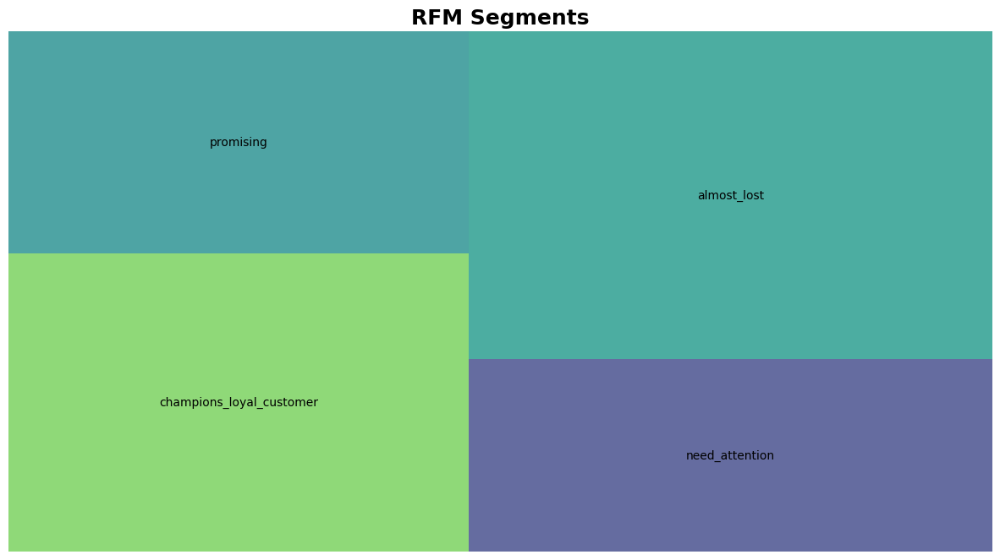

In [ ]:
import squarify as sq

fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(15, 8)
sq.plot(sizes=customer_segment['count'],
              label=['champions_loyal_customer',
                     'promising',
                     'need_attention',
                     'almost_lost'], alpha=0.8 )
plt.title("RFM Segments",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show()

**segment visualization with Plotly TreeMap**

In [ ]:
# import plotly.express as px

fig = px.treemap(customer_segment,
                 path=[customer_segment.index],
                 values='count',
                 width=900,
                 height=600)
fig.update_layout(title="RFM Segments",
                  title_x = 0.5, title_font = dict(size=18),
                 )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

**segment visualization with WordCloud**

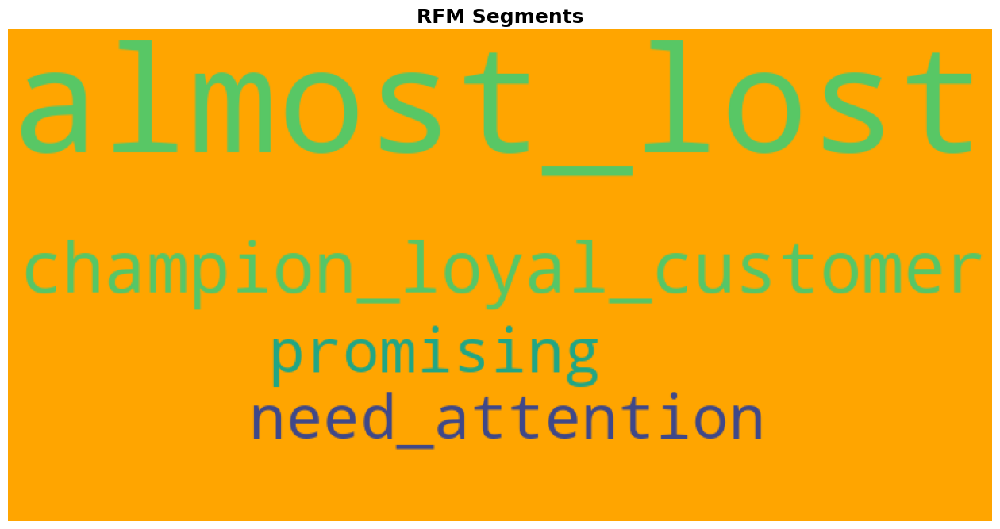

In [ ]:
# from wordcloud import WordCloud

segment_text = customer_rfm["customer_segment"].str.split(" ").str.join("_")
all_segments = " ".join(segment_text)

wc = WordCloud(background_color="orange",
               max_words=250,
               max_font_size=256,
               random_state=42,
               width=800, height=400)
wc.generate(all_segments)
plt.figure(figsize = (16, 15))
plt.imshow(wc)
plt.title("RFM Segments",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show()

Using customer segmentation categories found [here](http://www.blastam.com/blog/rfm-analysis-boosts-sales) we can formulate different marketing strategies and approaches for customer engagement for each type of customer.

Note: The author in the article scores 1 as the highest and 4 as the lowest

2. How many customers do we have in each segment?

In [ ]:
customer_rfm['customer_segment'].value_counts()

,count
customer_segment,
almost_lost,1314
champion_loyal_customer,1052
promising,783
need_attention,771


In [ ]:
customer_rfm.columns

Index(['recency', 'frequency', 'monetary', 'recency_score', 'frequency_score',
       'monetary_score', 'RFM_score', 'RFM_level', 'customer_segment'],
      dtype='object')

# Data Pre-Processing and Exploring

*i. Define and Plot Feature Correlations*

*ii. Visualize Feature Distributions*

*iii. Data Normalization*




Now that we have our customers segmented into 4 different categories, we can gain further insight into customer behavior by using predictive models in conjuction with out RFM model.
Possible algorithms include **Logistic Regression**, **K-means Clustering**, and **K-nearest Neighbor**. We will go with Hierarchical Clustering and  [K-Means](https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1) since we already have our distinct groups determined. K-means has also been widely used for market segmentation and has the advantage of being simple to implement.

In [ ]:
customer_rfm.head()

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,RFM_score,RFM_level,customer_segment
customerid,,,,,,,,,
12346.000,325,1,77183.600,1,1,4,114,6,need_attention
12747.000,2,11,4196.010,4,4,4,444,12,champion_loyal_customer
12748.000,0,209,33053.190,4,4,4,444,12,champion_loyal_customer
12749.000,3,5,4090.880,4,3,4,434,11,champion_loyal_customer
12820.000,3,4,942.340,4,3,3,433,10,champion_loyal_customer


In [ ]:
review(customer_rfm)
duplicate_values(customer_rfm)

Shape:(3920, 9)
****************************************************************************************************
Info:

<class 'pandas.core.frame.DataFrame'>
Index: 3920 entries, 12346.0 to 18287.0
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   recency           3920 non-null   int64  
 1   frequency         3920 non-null   int64  
 2   monetary          3920 non-null   float64
 3   recency_score     3920 non-null   int64  
 4   frequency_score   3920 non-null   int64  
 5   monetary_score    3920 non-null   int64  
 6   RFM_score         3920 non-null   object 
 7   RFM_level         3920 non-null   int64  
 8   customer_segment  3920 non-null   object 
dtypes: float64(1), int64(6), object(2)
memory usage: 306.2+ KB
None
****************************************************************************************************
Number of Uniques:
recency              302
frequency             57
monetary  

In [ ]:
customer_rfm.groupby('rfm_level').agg({'recency': ['mean','min','max','count'],
                                       'frequency': ['mean','min','max','count'],
                                       'monetary': ['mean','min','max','count'] }).round(1)

recency                 frequency                monetary           \
             mean  min  max count      mean min  max count     mean      min   
rfm_level                                                                      
3         264.900  142  373   396     1.000   1    1   396  157.200    3.800   
4         182.400   50  373   460     1.100   1    2   460  279.100    6.200   
5         107.400   17  371   458     1.300   1    4   458  360.400   20.800   
6          88.400    1  372   402     1.700   1    6   402  714.700    6.900   
7          76.000    1  358   369     2.300   1    6   369  698.200   36.600   
8          57.600    1  333   368     3.000   1    7   368 1135.900  102.400   
9          44.100    0  372   415     4.000   1   34   415 1385.300  201.100   
10         29.700    0  134   337     5.300   2   39   337 2417.900  306.700   
11         19.400    0   49   313     8.200   3   63   313 3619.200  801.100   
12          6.200    0   16   402    16.100   6  209   402 8566.800 1591.400   

                            
                 max count  
rfm_level                   
3            298.100   396  
4            642.000   460  
5           1384.200   458  
6          77183.600   402  
7           4314.700   369  
8          44534.300   368  
9           7832.500   415  
10        168472.500   337  
11         80850.800   313  
12        259657.300   402

### i. Define and Plot Feature Correlations

Create Heatmap and evaluate the results

In [ ]:
customer_rfm.corr(numeric_only=True)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,rfm_level
recency,1.000,-0.274,-0.129,-0.857,-0.504,-0.444,-0.703
frequency,-0.274,1.000,0.508,0.351,0.526,0.451,0.520
monetary,-0.129,0.508,1.000,0.176,0.239,0.261,0.264
recency_score,-0.857,0.351,0.176,1.000,0.534,0.460,0.776
frequency_score,-0.504,0.526,0.239,0.534,1.000,0.781,0.907
monetary_score,-0.444,0.451,0.261,0.460,0.781,1.000,0.876
rfm_level,-0.703,0.520,0.264,0.776,0.907,0.876,1.000


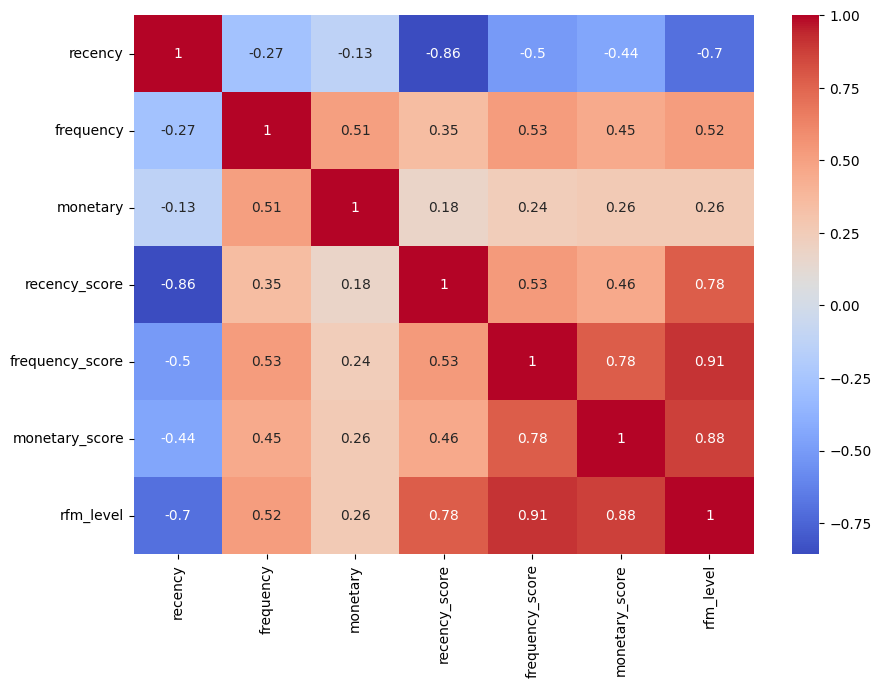

In [ ]:
plt.figure(figsize=(10,7))
sns.heatmap(customer_rfm.corr(numeric_only=True),annot=True, cmap="coolwarm");

In [ ]:
!pip install colorama
from colorama import Fore, Style

df_temp = customer_rfm.corr(numeric_only=True)

count = "Done"
feature =[]
collinear=[]
for col in df_temp.columns:
    for i in df_temp.index:
        if (df_temp[col][i]> .9 and df_temp[col][i] < 1) or (df_temp[col][i]< -.9 and df_temp[col][i] > -1) :
                feature.append(col)
                collinear.append(i)
                print(Fore.RED + Style.BRIGHT + f"multicolinearity alert in between" + Style.RESET_ALL + f" {col} - {i}")
        else:
            print(f"For {col} and {i}, there is NO multicollinearity problem")

print(Style.BRIGHT + "The number of strong corelated features:" + Style.RESET_ALL, count)

For recency and recency, there is NO multicollinearity problem
For recency and frequency, there is NO multicollinearity problem
For recency and monetary, there is NO multicollinearity problem
For recency and recency_score, there is NO multicollinearity problem
For recency and frequency_score, there is NO multicollinearity problem
For recency and monetary_score, there is NO multicollinearity problem
For recency and rfm_level, there is NO multicollinearity problem
For frequency and recency, there is NO multicollinearity problem
For frequency and frequency, there is NO multicollinearity problem
For frequency and monetary, there is NO multicollinearity problem
For frequency and recency_score, there is NO multicollinearity problem
For frequency and frequency_score, there is NO multicollinearity problem
For frequency and monetary_score, there is NO multicollinearity problem
For frequency and rfm_level, there is NO multicollinearity problem
For monetary and recency, there is NO multicollinear

### ii. Visualize Feature Distributions

To get a better understanding of the dataset, we can costruct a scatter matrix of each of the three features in the RFM data.

<Figure size 2000x2000 with 0 Axes>

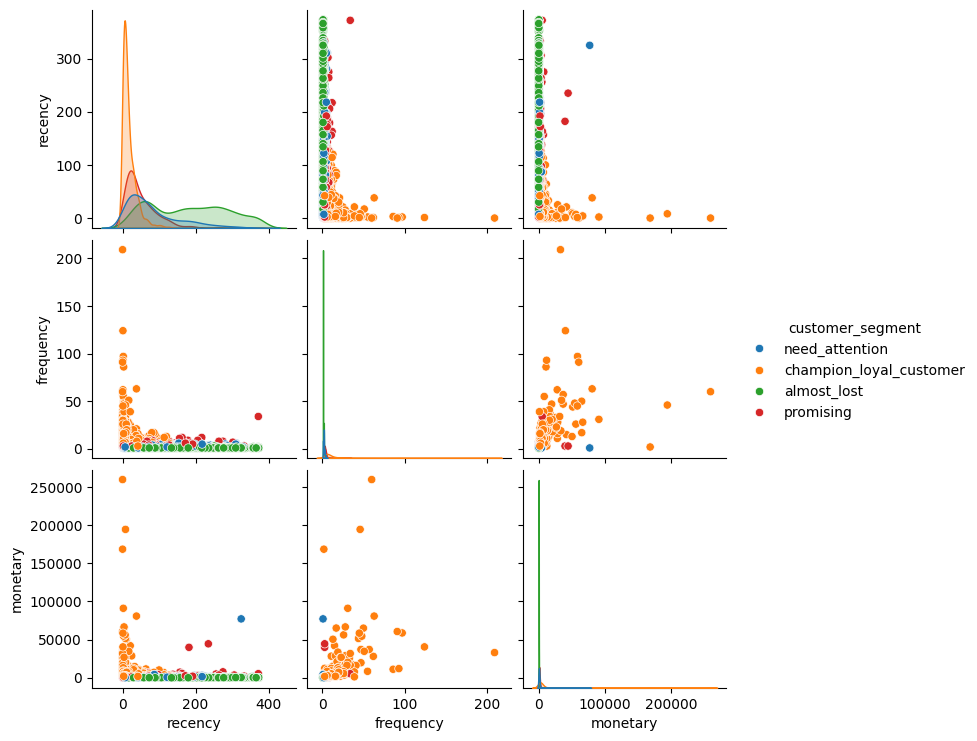

In [ ]:
plt.figure(figsize = (20,20))
sns.pairplot(customer_rfm[['recency', 'frequency', 'monetary','customer_segment']], hue = 'customer_segment');

In [ ]:
columns_to_plot = ['recency', 'frequency', 'monetary', 'recency_score', 'frequency_score', 'monetary_score', 'rfm_score', 'rfm_level', 'customer_segment']

for col in columns_to_plot:
    if col in customer_rfm.columns:
        fig = px.box(customer_rfm, y=col, title=col)
        fig.show()
    else:
        print(f"Column '{col}' not found in DataFrame.")

In [ ]:
numeric_cols = customer_rfm.select_dtypes(include='number').columns

for col in numeric_cols:
    fig = px.histogram(customer_rfm, x=col, nbins=50, title=f"Distribution of {col}")
    fig.show()

### iii. Data Normalization

1. We can use the logarithm method to normalize the values in a column.

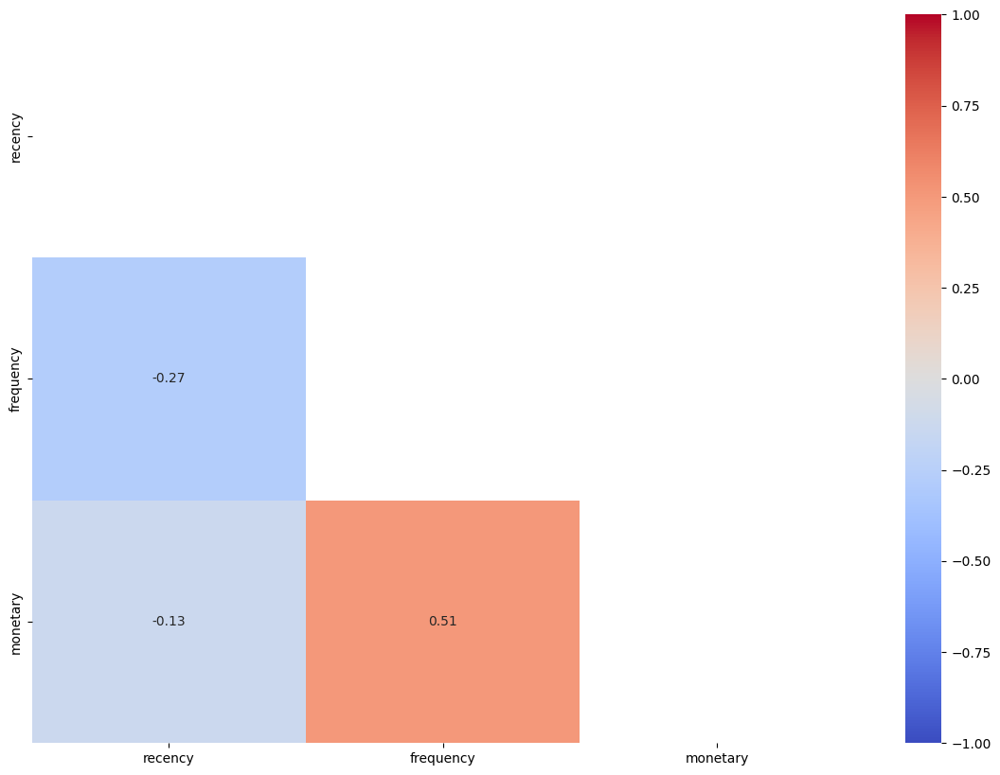

In [ ]:
matrix = np.triu(customer_rfm[['recency','frequency','monetary']].corr())
fig, ax = plt.subplots(figsize=(14,10))
sns.heatmap (customer_rfm[['recency','frequency','monetary']].corr(), annot=True, fmt= '.2f', vmin=-1, vmax=1, center=0, cmap='coolwarm',mask=matrix, ax=ax);

In [ ]:
skew_vals = customer_rfm.select_dtypes(include=np.number).skew().sort_values(ascending=False)
skew_vals

,0
monetary,20.218
frequency,10.752
recency,1.245
frequency_score,0.154
rfm_level,0.124
recency_score,0.022
monetary_score,0.000


In [ ]:
skew_limit = 0.75 # This is our threshold-limit to evaluate skewness. Overall below abs(1) seems acceptable for the linear models.
skew_vals = customer_rfm.select_dtypes(include=np.number).skew()
skew_cols = skew_vals[abs(skew_vals)> skew_limit].sort_values(ascending=False)
skew_cols

,0
monetary,20.218
frequency,10.752
recency,1.245


In [ ]:
#Interpreting Skewness

for skew in skew_vals:
    if -0.75 < skew < 0.75:
        print ("A skewness value of", '\033[1m', Fore.GREEN, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.GREEN, "symmetric", '\033[0m')
    elif  -0.75 < skew < -1.0 or 0.75 < skew < 1.0:
        print ("A skewness value of", '\033[1m', Fore.YELLOW, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.YELLOW, "moderately skewed", '\033[0m')
    else:
        print ("A skewness value of", '\033[1m', Fore.RED, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.RED, "highly skewed", '\033[0m')

A skewness value of   1.24499294569519  means that the distribution is approx.   highly skewed 
A skewness value of   10.751932091802605  means that the distribution is approx.   highly skewed 
A skewness value of   20.2175809603106  means that the distribution is approx.   highly skewed 
A skewness value of   0.021947084777365837  means that the distribution is approx.   symmetric 
A skewness value of   0.15376447610840366  means that the distribution is approx.   symmetric 
A skewness value of   0.0  means that the distribution is approx.   symmetric 
A skewness value of   0.12402727281772749  means that the distribution is approx.   symmetric 


In [ ]:
for col in skew_cols.index:
    fig = px.histogram(customer_rfm, x=col, title=f'Distribution of {col}')
    fig.show()

**Handling with Skewness - np.log**

In [ ]:
rfm_log = customer_rfm[['recency', 'frequency', 'monetary']].apply(np.log1p, axis = 1).round(3)
rfm_log.head()

,recency,frequency,monetary
customerid,,,
12346.000,5.787,0.693,11.254
12747.000,1.099,2.485,8.342
12748.000,0.000,5.347,10.406
12749.000,1.386,1.792,8.317
12820.000,1.386,1.609,6.849


In [ ]:
rfm_log.skew()

,0
recency,-0.464
frequency,1.182
monetary,0.373


In [ ]:
for col in rfm_log.columns:
    fig = px.histogram(rfm_log, x=col, nbins=50, title=f'Distribution of {col} (Log Transformed)')
    fig.show()

**Handling with Skewness - Power Transformer**

In [ ]:
rfm_trans = customer_rfm[['recency', 'frequency', 'monetary']]
pt = PowerTransformer(method='yeo-johnson')
trans= pt.fit_transform(rfm_trans)
rfm_trans = pd.DataFrame(trans, columns =skew_cols.index)
rfm_trans.head()

,monetary,frequency,recency
0,1.624,-1.158,3.204
1,-1.739,1.534,1.408
2,-2.226,2.354,2.726
3,-1.597,0.892,1.391
4,-1.597,0.658,0.300


In [ ]:
rfm_trans.skew()

,0
monetary,-0.064
frequency,0.216
recency,-0.014


In [ ]:
rfm_trans_long = rfm_trans.melt(var_name='RFM_Measure', value_name='Value')
fig = px.histogram(rfm_trans_long,
                   x='Value',
                   facet_col='RFM_Measure',
                   facet_col_wrap=3,
                   title='Distribution of RFM Values (Power Transformed)',
                   nbins=50)

fig.update_layout(height=800, showlegend=False)
fig.show()

- For normalization, we used 2 different methods, log1p method and PowerTransformer(method='yeo-johnson') and got different results. Since the results obtained with PowerTransformer(method='yeo-johnson') are better, we will continue with the normalization with the PowerTransformer(method='yeo-johnson') method in the next section.

2. Plot normalized data with scatter matrix or pairplot. Also evaluate results.

<Figure size 2000x2000 with 0 Axes>

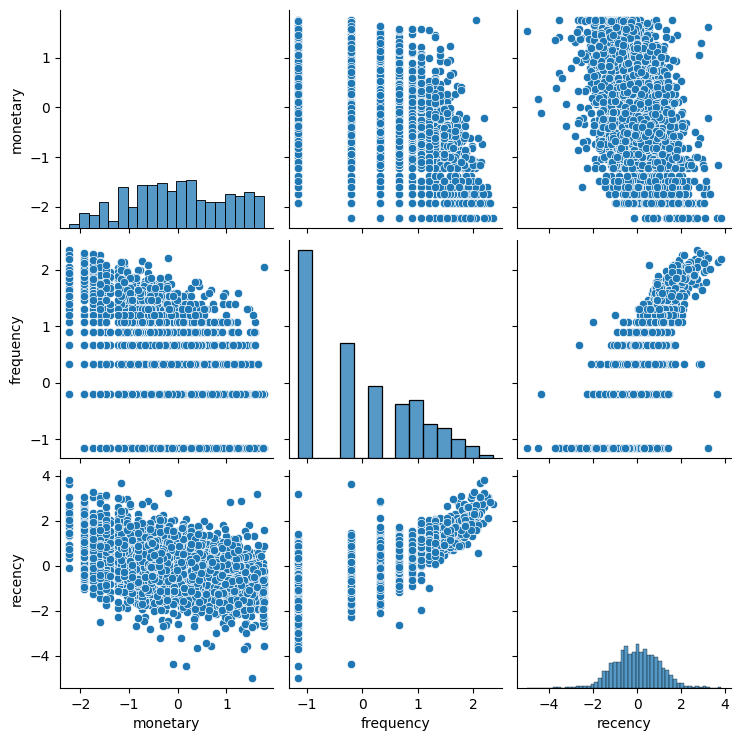

In [ ]:
plt.figure(figsize = (20,20))
sns.pairplot(rfm_trans);

In [ ]:
fig = px.scatter(data_frame = rfm_trans)
fig.show()

In [ ]:
for col in rfm_trans.columns:
    fig = px.box(rfm_trans, y=col, title=col, points="all")
    fig.show()

In [ ]:
# !pip install -U matplotlib
# from mpl_toolkits.mplot3d import Axes3D
fig = px.scatter_3d(rfm_trans,
                    x='recency',
                    y='frequency',
                    z='monetary',
                    color='recency')
fig.show();

#Hierarchical Clustering


Hierarchical clustering involves creating clusters that have a predetermined ordering from top to bottom. For example, all files and folders on the hard disk are organized in a hierarchy.

###Complete Linkage

In complete linkage hierarchical clustering, the distance between two clusters is defined as the longest distance between two points in each cluster. For example, the distance between clusters “r” and “s” to the left is equal to the length of the arrow between their two furthest points.

##Linkage method: complete (maximum distance between points)

Distance metric: euclidean (straight-line distance in RFM space)

This method tends to produce compact, well-separated clusters, good for customer segmentation.

In [ ]:
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

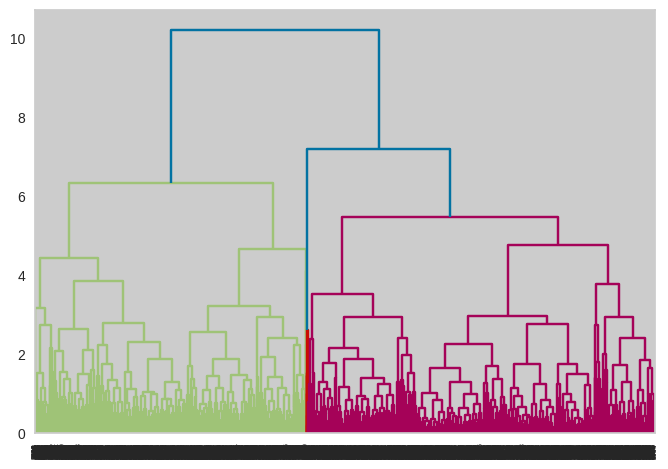

In [ ]:
mergings = linkage(rfm_trans, method="complete", metric='euclidean')
dendrogram(mergings)
plt.show()

The hierarchical clustering suggests that the data naturally forms around 3 clusters.

This result can be used to validate or compare against K-Means results. and label of customers into 3 clusters using AgglomerativeClustering(n_clusters=3) or fcluster based on this hierarchy.

#K-Means Implementation with rfm_trans DataFrame

For k-means, we have to set k to the number of clusters we want, but figuring out how many clusters is not obvious from the beginning. We will try different cluster numbers and check their [silhouette coefficient](http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html). The silhouette coefficient for a data point measures how similar it is to its assigned cluster from -1 (dissimilar) to 1 (similar).
<br>
<br>
**Note**: K-means is sensitive to initializations because they are critical to qualifty of optima found. Thus, we will use smart initialization called "Elbow Method".

# 4. Applying K-Means Clustering


- K-Means Implementation

    *i. Define Optimal Cluster Number (K) by using "Elbow Method" and "Silhouette Analysis"*

    *ii. Visualize the Clusters*

    *iii. Assign the label*

    *iv. Conclusion*

### i. Define the Optimal Number of Clusters

In [ ]:
pip install pyclustertend

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 87.1 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.


In [ ]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from pyclustertend import hopkins
from sklearn.preprocessing import scale
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import silhouette_samples,silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram

In [ ]:
hopkins(rfm_trans,rfm_trans.shape[0])

np.float64(0.08474206925911482)

[The Elbow Method](https://en.wikipedia.org/wiki/Elbow_method_(clustering)

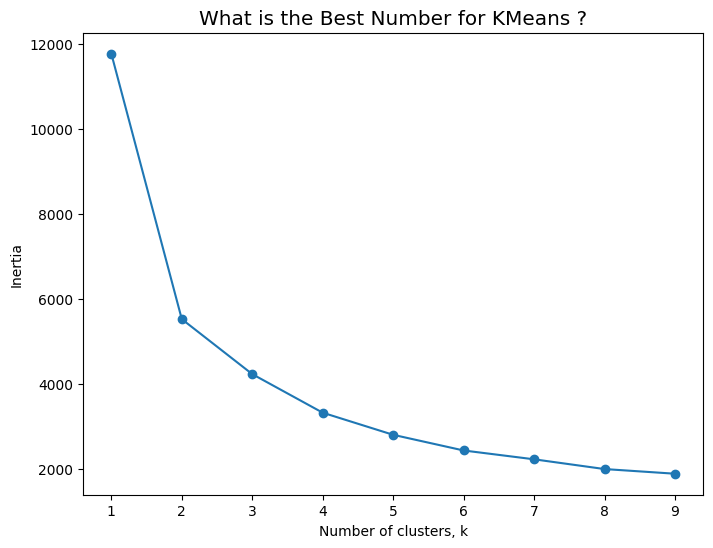

In [ ]:
#First : Get the Best KMeans
ks = range(1,10)
inertias=[]
for k in ks :
    # Create a KMeans clusters
    kc = KMeans(n_clusters=k,random_state=1)
    kc.fit(rfm_trans)
    inertias.append(kc.inertia_)

# Plot ks vs inertias
f, ax = plt.subplots(figsize=(8, 6))
plt.plot(ks, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.style.use('ggplot')
plt.title('What is the Best Number for KMeans ?')
plt.show()

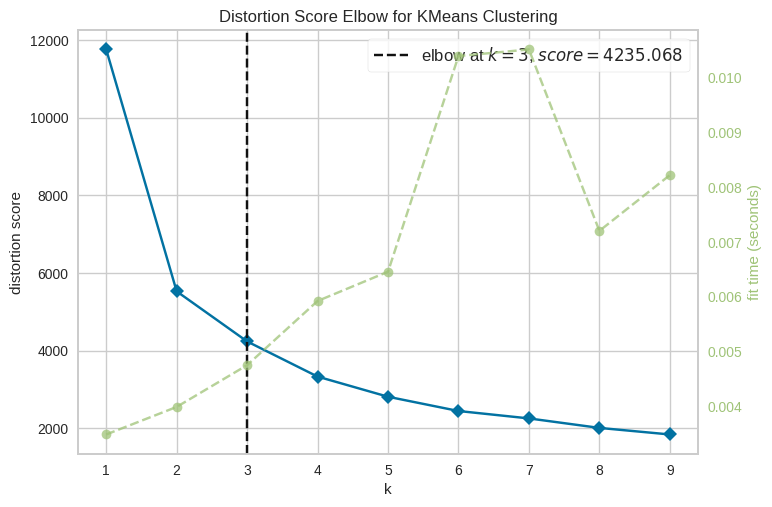

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans()
visu = KElbowVisualizer(kmeans, k = (1,10))
visu.fit(rfm_trans)
visu.show();

[Silhouette Coefficient](http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)

In [ ]:
ssd =[]

K = range(2,10)

for k in K:
    model = KMeans(n_clusters=k)
    model.fit(rfm_trans)
    ssd.append(model.inertia_)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(rfm_trans, model.labels_)}')

Silhouette Score for 2 clusters: 0.43582148158683937
Silhouette Score for 3 clusters: 0.331721222233278
Silhouette Score for 4 clusters: 0.33494281716835805
Silhouette Score for 5 clusters: 0.32609544163766113
Silhouette Score for 6 clusters: 0.3237938735844773
Silhouette Score for 7 clusters: 0.3137328317899381
Silhouette Score for 8 clusters: 0.3079948876964452
Silhouette Score for 9 clusters: 0.3088315000091576


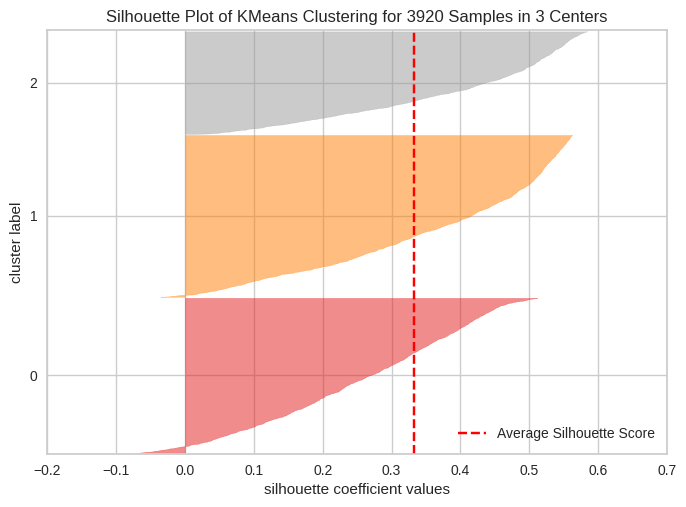

In [ ]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model_3 = KMeans(n_clusters=3, random_state=101)
visualizer = SilhouetteVisualizer(model_3)
visualizer.fit(rfm_trans)    # Fit the data to the visualizer
visualizer.poof();

### ii. Model Fitting

Fit the K-Means Algorithm with the optimal number of clusters we decided and save the model to disk.

In [ ]:
k_means_model = KMeans(n_clusters = 3, random_state = 101)
k_means_model.fit_predict(rfm_trans)
labels = k_means_model.labels_
labels

array([0, 2, 2, ..., 0, 2, 0], dtype=int32)

In [ ]:
rfm_trans['predicted_clusters'] = labels
rfm_trans

,monetary,frequency,recency,predicted_clusters
0,1.624,-1.158,3.204,0
1,-1.739,1.534,1.408,2
2,-2.226,2.354,2.726,2
3,-1.597,0.892,1.391,2
4,-1.597,0.658,0.300,2
...,...,...,...,...
3915,1.464,-1.158,-1.098,1
3916,1.053,-1.158,-1.848,1
3917,-1.226,-0.198,-1.111,0
3918,-1.597,1.750,0.893,2


In [ ]:
rfm_trans['predicted_clusters'].value_counts()

,count
predicted_clusters,
1,1513
0,1448
2,959


In [ ]:
cluster_counts = rfm_trans['predicted_clusters'].value_counts().reset_index()
cluster_counts.columns = ['predicted_cluster', 'count']
fig = px.pie(cluster_counts,
             values='count',
             names='predicted_cluster',
             title='Predicted_Clusters Distribution')

fig.show()

In [ ]:
customer_rfm['predicted_clusters'] = labels
customer_rfm

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,rfm_score,rfm_level,customer_segment,predicted_clusters
customerid,,,,,,,,,,
12346.000,325,1,77183.600,1,1,4,114,6,need_attention,0
12747.000,2,11,4196.010,4,4,4,444,12,champion_loyal_customer,2
12748.000,0,209,33053.190,4,4,4,444,12,champion_loyal_customer,2
12749.000,3,5,4090.880,4,3,4,434,11,champion_loyal_customer,2
12820.000,3,4,942.340,4,3,3,433,10,champion_loyal_customer,2
...,...,...,...,...,...,...,...,...,...,...
18280.000,277,1,180.600,1,1,1,111,3,almost_lost,1
18281.000,180,1,80.820,1,1,1,111,3,almost_lost,1
18282.000,7,2,178.050,4,2,1,421,7,need_attention,0


### iii. Visualize the Clusters

1. Create a scatter plot and select cluster centers

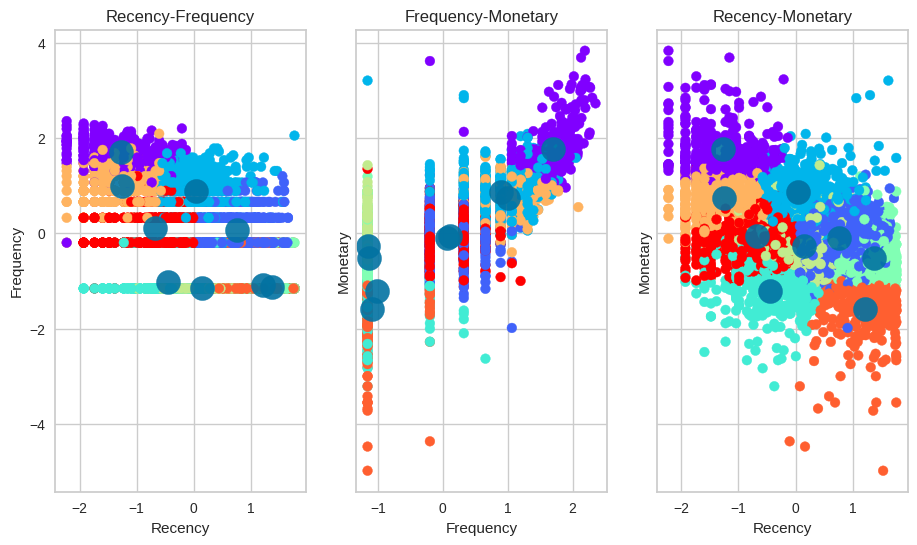

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(11, 6)) # sharey=True ile y eksen labels lari ortak kullanirlar.

ax1.set_title('Recency-Frequency')
ax1.set_xlabel('Recency')
ax1.set_ylabel('Frequency')
ax1.scatter(rfm_trans.iloc[:,0], rfm_trans.iloc[:, 1], c=kmeans.labels_, cmap="rainbow")
ax1.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300,alpha=0.9, label = 'Centroids')

ax2.set_title("Frequency-Monetary")
ax2.set_xlabel('Frequency')
ax2.set_ylabel('Monetary')
ax2.scatter(rfm_trans.iloc[:,1], rfm_trans.iloc[:, 2], c=kmeans.labels_,cmap="rainbow")
ax2.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 2], s=300,alpha=0.9, label = 'Centroids')

ax3.set_title("Recency-Monetary")
ax3.set_xlabel('Recency')
ax3.set_ylabel('Monetary')
ax3.scatter(rfm_trans.iloc[:, 0], rfm_trans.iloc[:, 2], c=kmeans.labels_,cmap="rainbow")
ax3.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 2], s=300,alpha=0.9, label = 'Centroids');

2. Visualize Cluster Id vs Recency, Cluster Id vs Frequency and Cluster Id vs Monetary using Box plot. Also evaluate the results.

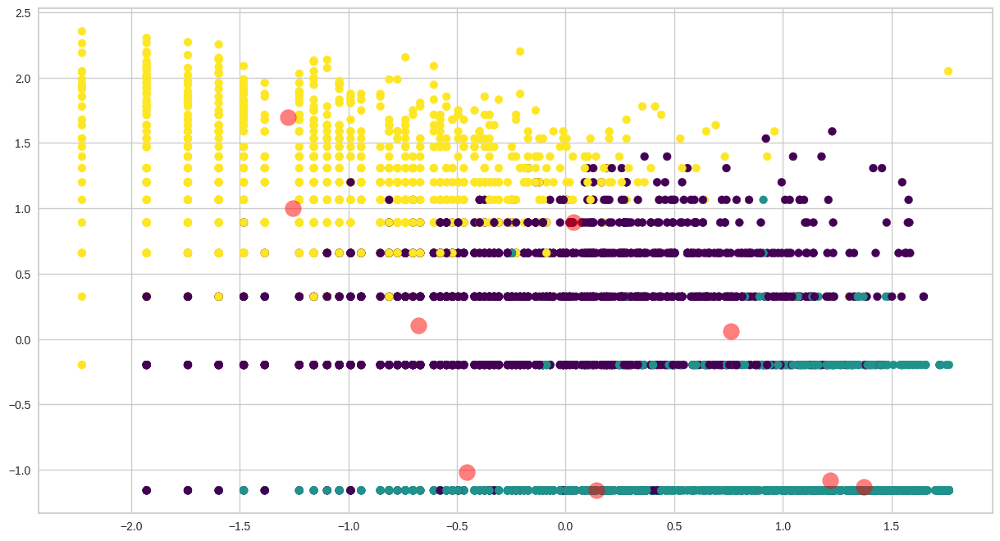

In [ ]:
plt.figure(figsize=(15, 8))
plt.scatter(rfm_trans.iloc[:, 0], rfm_trans.iloc[:, 1], c = labels, s = 50, cmap = "viridis")
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='red',alpha=0.5, label = 'Centroids');

### iv. Assign the Label

In [ ]:
customer_rfm.head(10)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,rfm_score,rfm_level,customer_segment,predicted_clusters
customerid,,,,,,,,,,
12346.000,325,1,77183.600,1,1,4,114,6,need_attention,0
12747.000,2,11,4196.010,4,4,4,444,12,champion_loyal_customer,2
12748.000,0,209,33053.190,4,4,4,444,12,champion_loyal_customer,2
12749.000,3,5,4090.880,4,3,4,434,11,champion_loyal_customer,2
12820.000,3,4,942.340,4,3,3,433,10,champion_loyal_customer,2
12821.000,214,1,92.720,1,1,1,111,3,almost_lost,1
12822.000,70,2,948.880,2,2,3,223,7,need_attention,0
12823.000,74,5,1759.500,2,3,4,234,9,promising,0
12824.000,59,1,397.120,2,1,2,212,5,almost_lost,1


In [ ]:
customer_rfm['predicted_clusters'] = customer_rfm['predicted_clusters'].map({0:'passer_customers', 1:'almost_lost', 2:'best_customers' })

In [ ]:
customer_rfm.head(10)

,recency,frequency,monetary,recency_score,frequency_score,monetary_score,rfm_score,rfm_level,customer_segment,predicted_clusters
customerid,,,,,,,,,,
12346.000,325,1,77183.600,1,1,4,114,6,need_attention,passer_customers
12747.000,2,11,4196.010,4,4,4,444,12,champion_loyal_customer,best_customers
12748.000,0,209,33053.190,4,4,4,444,12,champion_loyal_customer,best_customers
12749.000,3,5,4090.880,4,3,4,434,11,champion_loyal_customer,best_customers
12820.000,3,4,942.340,4,3,3,433,10,champion_loyal_customer,best_customers
12821.000,214,1,92.720,1,1,1,111,3,almost_lost,almost_lost
12822.000,70,2,948.880,2,2,3,223,7,need_attention,passer_customers
12823.000,74,5,1759.500,2,3,4,234,9,promising,passer_customers
12824.000,59,1,397.120,2,1,2,212,5,almost_lost,almost_lost


**Conclusion**
- Cluster 1 : This cluster is more related to the "Almost Lost" segment as they Haven’t purchased for some time(R=1), but used to purchase frequently and spent a lot.
- Cluster 2 : The second cluster belongs to the "Best Customers" segment which we saw earlier as they purchase recently (R=4), frequent buyers (F=4), and spent the most (M=4)
- Cluster 0 : The third cluster can be interpreted as passer customers as their last purchase is long ago (R<=1),purchased very few (F>=2 & F < 4) and spent little (M>=4 & M < 4).Company has to come up with new strategies to make them permanent members. Low value customers

### v. Conclusion

Compare customer segmentation labels from the Customer Segmentation with the labels found by K-Means.

In [ ]:
customer_rfm['customer_segment'].value_counts()

,count
customer_segment,
almost_lost,1314
champion_loyal_customer,1052
promising,783
need_attention,771


In [ ]:
customer_rfm[customer_rfm['predicted_clusters']=='almost_lost']['customer_segment'].value_counts()

,count
customer_segment,
almost_lost,1298
need_attention,215


In [ ]:
crosstab_df = pd.crosstab(customer_rfm['predicted_clusters'], customer_rfm['customer_segment'])
crosstab_df = crosstab_df.reset_index()
melted_df = crosstab_df.melt(id_vars='predicted_clusters', var_name='customer_segment', value_name='count')
fig = px.bar(melted_df,
             x='predicted_clusters',
             y='count',
             color='customer_segment',
             barmode='group',
             title='Compare (predicted-clusters vs customer-segment)',
             labels={'predicted_clusters': 'Clusters & Segments', 'count': 'Counts'})
fig.show()

In [ ]:
segment_counts = customer_rfm[customer_rfm['predicted_clusters']=='almost_lost']['customer_segment'].value_counts().reset_index()
segment_counts.columns = ['customer_segment', 'count']
fig = px.pie(segment_counts,
             values='count',
             names='customer_segment',
             title='Predicted_Clusters_Almost_Lost Distribution')
fig.show()

In [ ]:
customer_rfm[customer_rfm['predicted_clusters']=='passer_customers']['customer_segment'].value_counts()

,count
customer_segment,
promising,757
need_attention,556
champion_loyal_customer,119
almost_lost,16


In [ ]:
segment_counts_passer = customer_rfm[customer_rfm['predicted_clusters']=='passer_customers']['customer_segment'].value_counts().reset_index()
segment_counts_passer.columns = ['customer_segment', 'count']
fig = px.pie(segment_counts_passer,
             values = 'count',
             names = 'customer_segment',
             title = 'Predicted_Clusters_Passer_Customers Distribution')
fig.show()

In [ ]:
customer_rfm[customer_rfm['predicted_clusters']=='best_customers']['customer_segment'].value_counts()

,count
customer_segment,
champion_loyal_customer,933
promising,26


In [ ]:
segment_counts_best = customer_rfm[customer_rfm['predicted_clusters']=='best_customers']['customer_segment'].value_counts().reset_index()
segment_counts_best.columns = ['customer_segment', 'count']
fig = px.pie(segment_counts_best,
             values='count',
             names='customer_segment',
             title='Predicted_Clusters_Best_Customers Distribution')
fig.show()

In [ ]:
customer_rfm['customer_segment'].value_counts()

,count
customer_segment,
almost_lost,1314
champion_loyal_customer,1052
promising,783
need_attention,771


In [ ]:
ct = pd.crosstab(customer_rfm['customer_segment'], customer_rfm['predicted_clusters'])
ct_long = ct.reset_index().melt(id_vars='customer_segment',
                                var_name='predicted_cluster',
                                value_name='count')

fig = px.bar(ct_long, x='customer_segment', y='count', color='predicted_cluster',
             barmode='group',
             title='Compare Customer Segment vs Predicted Clusters',
             labels={'count': 'Count', 'customer_segment': 'Customer & Segment'})
fig.show()

In [ ]:
champion_loyal_counts = customer_rfm[customer_rfm['customer_segment'] == 'champion_loyal_customer']['predicted_clusters'].value_counts().reset_index()
champion_loyal_counts.columns = ['predicted_clusters', 'count']

fig = px.pie(
    champion_loyal_counts,
    values='count',
    names='predicted_clusters',
    title='Customer Segment: Champion_Loyal_Customer Distribution')
fig.show()

In [ ]:
promising_counts = customer_rfm[customer_rfm['customer_segment'] == 'promising']['predicted_clusters'].value_counts().reset_index()
promising_counts.columns = ['predicted_clusters', 'count']

fig = px.pie(
    promising_counts,
    values='count',
    names='predicted_clusters',
    title='Customer Segment: Promising Distribution')
fig.show()

In [ ]:
need_attention_counts = customer_rfm[customer_rfm['customer_segment'] == 'need_attention']['predicted_clusters'].value_counts().reset_index()
need_attention_counts.columns = ['predicted_clusters', 'count']

fig = px.pie(
    need_attention_counts,
    values='count',
    names='predicted_clusters',
    title='Customer Segment: Need_Attention Distribution')
fig.show()

In [ ]:
almost_lost = customer_rfm[customer_rfm['customer_segment'] == 'almost_lost']['predicted_clusters'].value_counts().reset_index()
almost_lost.columns = ['predicted_clusters', 'count']

fig = px.pie(
    almost_lost,
    values='count',
    names='predicted_clusters',
    title='Customer Segment: Almost_Lost Distribution')
fig.show()

How we want to continue this analysis depends on how the business plans to use the results and the level of granularity the business stakeholders want to see in the clusters. We can also ask what range of customer behavior from high to low value customers are the stakeholders interested in exploring. From those answers, various methods of clustering can be used and applied on RFM variable or directly on the transaction data set.

**Annotation:**

Limitations of K-means clustering:

1. There is no assurance that it will lead to the global best solution.
2. Can't deal with different shapes(not circular) and consider one point's probability of belonging to more than one cluster.

These disadvantages of K-means show that for many datasets (especially low-dimensional datasets), it may not perform as well as we might hope.

# 5. Create Cohort & Conduct Cohort Analysis

- Future Engineering

    *i. Extract the Month of the Purchase*

    *ii. Calculating time offset in Months i.e. Cohort Index*


- Create 1st Cohort: User Number & Retention Rate

    *i. Pivot Cohort and Cohort Retention*

    *ii. Visualize analysis of cohort 1 using seaborn and matplotlib*


- Create 2nd Cohort: Average Quantity Sold

    *i. Pivot Cohort and Cohort Retention*

    *ii. Visualize analysis of cohort 2 using seaborn and matplotlib*


- Create 3rd Cohort: Average Sales

    *i. Pivot Cohort and Cohort Retention*

    *ii. Visualize analysis of cohort 3 using seaborn and matplotlib*

[Cohort Analysis](https://medium.com/swlh/cohort-analysis-using-python-and-pandas-d2a60f4d0a4d) is specifically useful in analyzing user growth patterns for products. In terms of a product, a cohort can be a group of people with the same sign-up date, the same usage starts month/date, or the same traffic source.
Cohort analysis is an analytics method by which these groups can be tracked over time for finding key insights. This analysis can further be used to do customer segmentation and track metrics like retention, churn, and lifetime value.

For e-commerce organizations, cohort analysis is a unique opportunity to find out which clients are the most valuable to their business. By performing Cohort analysis we can get the following answers to the following questions:

- How much effective was a marketing campaign held in a particular time period?
- Did the strategy employ to improve the conversion rates of Customers worked?
- Should I focus more on retention rather than acquiring new customers?
- Are my customer nurturing strategies effective?
- Which marketing channels bring me the best results?
- Is there a seasonality pattern in Customer behavior?
- Along with various performance measures/metrics for our organization.

Since we will be performing Cohort Analysis based on transaction records of customers, the columns we will be dealing with mainly:
- Invoice Data
- CustomerID
- Price
- Quantity

The following steps will performed to generate the Cohort Chart of Retention Rate:
- Month Extraction from InvioceDate column
- Assigning Cohort to Each Transaction
- Assigning Cohort Index to each transaction
- Calculating number of unique customers in each Group of (ChortDate,Index)
- Creating Cohort Table for Retention Rate
- Creating the Cohort Chart using the Cohort Table

The Detailed information about each step is given below:

## Future Engineering

### i. Extract the Month of the Purchase
First we will create a function, which takes any date and returns the formatted date with day value as 1st of the same month and Year.

In [ ]:
df_uk["invoicedate"] = pd.to_datetime(df_uk["invoicedate"])

In [ ]:
def get_month(x) : return dt.datetime(x.year,x.month,1)

Now we will use the function created above to convert all the invoice dates into respective month date format.

In [ ]:
df_uk['invoice_month'] = df_uk['invoicedate'].apply(get_month)
grouping = df_uk.groupby('customerid')['invoice_month']
df_uk['cohort_month'] = grouping.transform('min')
df_uk.tail()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,customer_recency,recency,customer_frequency,customer_monetary,invoice_month,cohort_month
541889,581585,22466,FAIRY TALE COTTAGE NIGHT LIGHT,12,2011-12-09 12:31:00,1.950,15804.000,United Kingdom,23.400,2011-12-09,2011-12-09,0 days,0,262,4206.390,2011-12-01,2011-05-01
541890,581586,22061,LARGE CAKE STAND HANGING STRAWBERY,8,2011-12-09 12:49:00,2.950,13113.000,United Kingdom,23.600,2011-12-09,2011-12-09,0 days,0,200,12245.960,2011-12-01,2010-12-01
541891,581586,23275,SET OF 3 HANGING OWLS OLLIE BEAK,24,2011-12-09 12:49:00,1.250,13113.000,United Kingdom,30.000,2011-12-09,2011-12-09,0 days,0,200,12245.960,2011-12-01,2010-12-01
541892,581586,21217,RED RETROSPOT ROUND CAKE TINS,24,2011-12-09 12:49:00,8.950,13113.000,United Kingdom,214.800,2011-12-09,2011-12-09,0 days,0,200,12245.960,2011-12-01,2010-12-01
541893,581586,20685,DOORMAT RED RETROSPOT,10,2011-12-09 12:49:00,7.080,13113.000,United Kingdom,70.800,2011-12-09,2011-12-09,0 days,0,200,12245.960,2011-12-01,2010-12-01


### ii. Calculating time offset in Months i.e. Cohort Index:
Calculating time offset for each transaction will allows us to report the metrics for each cohort in a comparable fashion.
First, we will create 4 variables that capture the integer value of years, months for Invoice and Cohort Date using the get_date_int() function which we'll create it below.

In [ ]:
def get_date_int (dframe,column):
    year = dframe[column].dt.year
    month = dframe[column].dt.month
    day = dframe[column].dt.day
    return year, month , day

We will use this function to extract the integer values for Invoice as well as Cohort Date in 3 seperate series for each of the two columns

In [ ]:
invoice_year,invoice_month,_ = get_date_int(df_uk,'invoice_month')
cohort_year,cohort_month,_ = get_date_int(df_uk,'cohort_month')

Use the variables created above to calcualte the difference in days and store them in cohort Index column.

In [ ]:
year_diff = invoice_year - cohort_year
month_diff = invoice_month - cohort_month

df_uk['cohort_index'] = year_diff * 12 + month_diff + 1
df_uk

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,customer_recency,recency,customer_frequency,customer_monetary,invoice_month,cohort_month,cohort_index
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.550,17850.000,United Kingdom,15.300,2011-12-09,2010-12-01,372 days,372,297,5391.210,2010-12-01,2010-12-01,1
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297,5391.210,2010-12-01,2010-12-01,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.750,17850.000,United Kingdom,22.000,2011-12-09,2010-12-01,372 days,372,297,5391.210,2010-12-01,2010-12-01,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297,5391.210,2010-12-01,2010-12-01,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.390,17850.000,United Kingdom,20.340,2011-12-09,2010-12-01,372 days,372,297,5391.210,2010-12-01,2010-12-01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541889,581585,22466,FAIRY TALE COTTAGE NIGHT LIGHT,12,2011-12-09 12:31:00,1.950,15804.000,United Kingdom,23.400,2011-12-09,2011-12-09,0 days,0,262,4206.390,2011-12-01,2011-05-01,8
541890,581586,22061,LARGE CAKE STAND HANGING STRAWBERY,8,2011-12-09 12:49:00,2.950,13113.000,United Kingdom,23.600,2011-12-09,2011-12-09,0 days,0,200,12245.960,2011-12-01,2010-12-01,13
541891,581586,23275,SET OF 3 HANGING OWLS OLLIE BEAK,24,2011-12-09 12:49:00,1.250,13113.000,United Kingdom,30.000,2011-12-09,2011-12-09,0 days,0,200,12245.960,2011-12-01,2010-12-01,13
541892,581586,21217,RED RETROSPOT ROUND CAKE TINS,24,2011-12-09 12:49:00,8.950,13113.000,United Kingdom,214.800,2011-12-09,2011-12-09,0 days,0,200,12245.960,2011-12-01,2010-12-01,13


## Create 1st Cohort: User number & Retention Rate

### i. Pivot Cohort and Cohort Retention

In [ ]:
#Count monthly active customers from each cohort
grouping = df_uk.groupby(by=['cohort_month', 'cohort_index'])
cohort_data = grouping['customerid'].apply(pd.Series.nunique)
cohort_data

cohort_month  cohort_index
2010-12-01    1               815
              2               289
              3               263
              4               304
              5               293
              6               323
              7               291
              8               278
              9               289
              10              325
              11              299
              12              405
              13              218
2011-01-01    1               358
              2                76
              3                93
              4                84
              5               119
              6                99
              7                90
              8                87
              9               108
              10              117
              11              127
              12               43
2011-02-01    1               340
              2                64
              3                66
              4                97
              5                98
              6                86
              7                87
              8                96
              9                90
              10              104
              11               25
2011-03-01    1               419
              2                64
              3               109
              4                83
              5                94
              6                69
              7               111
              8                96
              9               119
              10               38
2011-04-01    1               277
              2                58
              3                56
              4                60
              5                56
              6                61
              7                61
              8                73
              9                20
2011-05-01    1               256
              2                48
              3                44
              4                44
              5                53
              6                58
              7                68
              8                23
2011-06-01    1               214
              2                38
              3                31
              4                51
              5                51
              6                69
              7                21
2011-07-01    1               169
              2                30
              3                33
              4                39
              5                47
              6                18
2011-08-01    1               141
              2                32
              3                32
              4                34
              5                17
2011-09-01    1               276
              2                63
              3                83
              4                32
2011-10-01    1               324
              2                79
              3                36
2011-11-01    1               297
              2                35
2011-12-01    1                34
Name: customerid, dtype: int64

In [ ]:
# Return number of unique elements in the object.
cohort_data = cohort_data.reset_index()
cohort_counts = cohort_data.pivot(index='cohort_month',columns='cohort_index',values='customerid')
cohort_counts

cohort_index,1,2,3,4,5,6,7,8,9,10,11,12,13
cohort_month,,,,,,,,,,,,,
2010-12-01,815.000,289.000,263.000,304.000,293.000,323.000,291.000,278.000,289.000,325.000,299.000,405.000,218.000
2011-01-01,358.000,76.000,93.000,84.000,119.000,99.000,90.000,87.000,108.000,117.000,127.000,43.000,NaN
2011-02-01,340.000,64.000,66.000,97.000,98.000,86.000,87.000,96.000,90.000,104.000,25.000,NaN,NaN
2011-03-01,419.000,64.000,109.000,83.000,94.000,69.000,111.000,96.000,119.000,38.000,NaN,NaN,NaN
2011-04-01,277.000,58.000,56.000,60.000,56.000,61.000,61.000,73.000,20.000,NaN,NaN,NaN,NaN
2011-05-01,256.000,48.000,44.000,44.000,53.000,58.000,68.000,23.000,NaN,NaN,NaN,NaN,NaN
2011-06-01,214.000,38.000,31.000,51.000,51.000,69.000,21.000,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,169.000,30.000,33.000,39.000,47.000,18.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,141.000,32.000,32.000,34.000,17.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Retention table
cohort_size = cohort_counts.iloc[:,0]
retention = cohort_counts.divide(cohort_size,axis=0) #axis=0 to ensure the divide along the row axis
retention.round(3) * 100 #to show the number as percentage

cohort_index,1,2,3,4,5,6,7,8,9,10,11,12,13
cohort_month,,,,,,,,,,,,,
2010-12-01,100.000,35.500,32.300,37.300,36.000,39.600,35.700,34.100,35.500,39.900,36.700,49.700,26.700
2011-01-01,100.000,21.200,26.000,23.500,33.200,27.700,25.100,24.300,30.200,32.700,35.500,12.000,NaN
2011-02-01,100.000,18.800,19.400,28.500,28.800,25.300,25.600,28.200,26.500,30.600,7.400,NaN,NaN
2011-03-01,100.000,15.300,26.000,19.800,22.400,16.500,26.500,22.900,28.400,9.100,NaN,NaN,NaN
2011-04-01,100.000,20.900,20.200,21.700,20.200,22.000,22.000,26.400,7.200,NaN,NaN,NaN,NaN
2011-05-01,100.000,18.800,17.200,17.200,20.700,22.700,26.600,9.000,NaN,NaN,NaN,NaN,NaN
2011-06-01,100.000,17.800,14.500,23.800,23.800,32.200,9.800,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,100.000,17.800,19.500,23.100,27.800,10.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,100.000,22.700,22.700,24.100,12.100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### ii. Visualize analysis of cohort 1 using seaborn and matplotlib modules

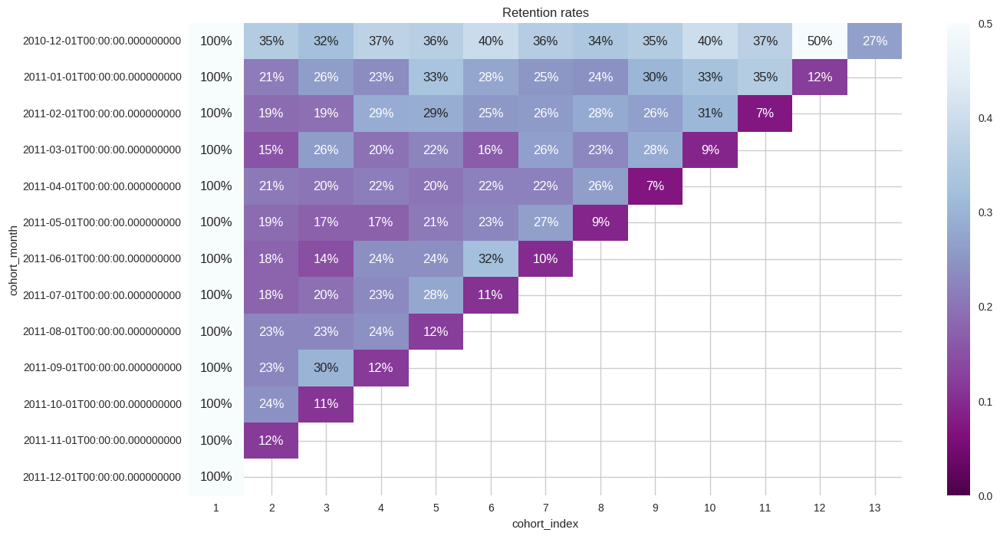

In [ ]:
plt.figure(figsize=(15, 8))
plt.title('Retention rates')
sns.heatmap(data=retention,annot = True,fmt = '.0%',vmin = 0.0,vmax = 0.5, cmap="BuPu_r")
plt.show()

<Axes: xlabel='cohort_month', ylabel='1'>

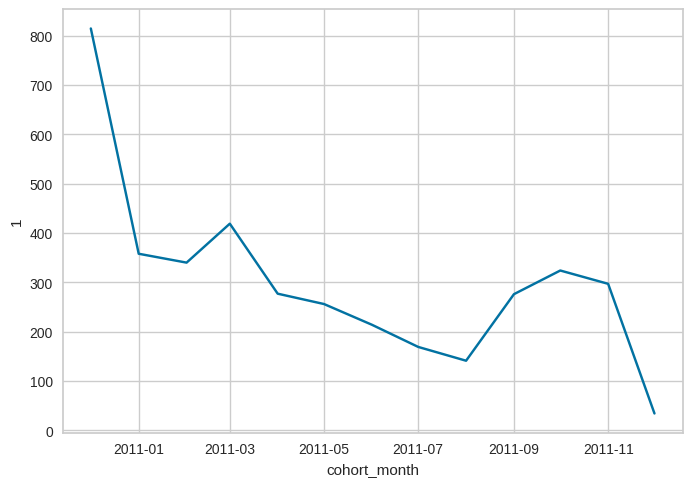

In [ ]:
sns.lineplot(data=cohort_counts[1])

In [ ]:
cohort_data[cohort_data["cohort_index"]==1]

,cohort_month,cohort_index,customerid
0,2010-12-01,1,815
13,2011-01-01,1,358
25,2011-02-01,1,340
36,2011-03-01,1,419
46,2011-04-01,1,277
55,2011-05-01,1,256
63,2011-06-01,1,214
70,2011-07-01,1,169
76,2011-08-01,1,141
81,2011-09-01,1,276


## Create the 2nd Cohort: Average Quantity Sold

### i. Pivot Cohort and Cohort Retention

In [ ]:

grouping = df_uk.groupby(['cohort_month', 'cohort_index'])
cohort_data = grouping['quantity'].mean()
cohort_data = cohort_data.reset_index()
average_quantity = cohort_data.pivot(index='cohort_month',columns='cohort_index',values='quantity')
average_quantity.round(1)
average_quantity.index = average_quantity.index.date

In [ ]:
cohort_data

,cohort_month,cohort_index,quantity
0,2010-12-01,1,11.364
1,2010-12-01,2,12.862
2,2010-12-01,3,13.931
3,2010-12-01,4,13.874
4,2010-12-01,5,13.344
5,2010-12-01,6,13.288
6,2010-12-01,7,14.275
7,2010-12-01,8,13.773
8,2010-12-01,9,16.146
9,2010-12-01,10,16.125


In [ ]:
average_quantity

cohort_index,1,2,3,4,5,6,7,8,9,10,11,12,13
2010-12-01,11.364,12.862,13.931,13.874,13.344,13.288,14.275,13.773,16.146,16.125,16.672,12.446,14.462
2011-01-01,18.080,9.629,9.442,15.098,10.090,10.894,13.555,10.815,10.761,8.696,8.592,10.022,NaN
2011-02-01,10.997,14.050,15.957,12.126,12.321,11.928,13.872,13.722,10.997,12.543,13.819,NaN,NaN
2011-03-01,9.693,11.430,13.305,10.087,13.533,12.838,13.107,14.062,11.207,9.734,NaN,NaN,NaN
2011-04-01,10.068,10.157,9.721,11.941,11.864,8.262,9.874,9.364,7.478,NaN,NaN,NaN,NaN
2011-05-01,10.658,9.393,14.860,12.800,11.046,8.311,10.816,126.911,NaN,NaN,NaN,NaN,NaN
2011-06-01,9.550,14.786,11.980,12.738,9.818,8.891,9.350,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,10.146,14.985,6.573,8.112,5.778,6.683,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,9.394,6.029,5.028,5.909,6.559,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-09-01,11.928,6.140,7.853,9.006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### ii. Visualize analysis of cohort 2 using seaborn and matplotlib modules

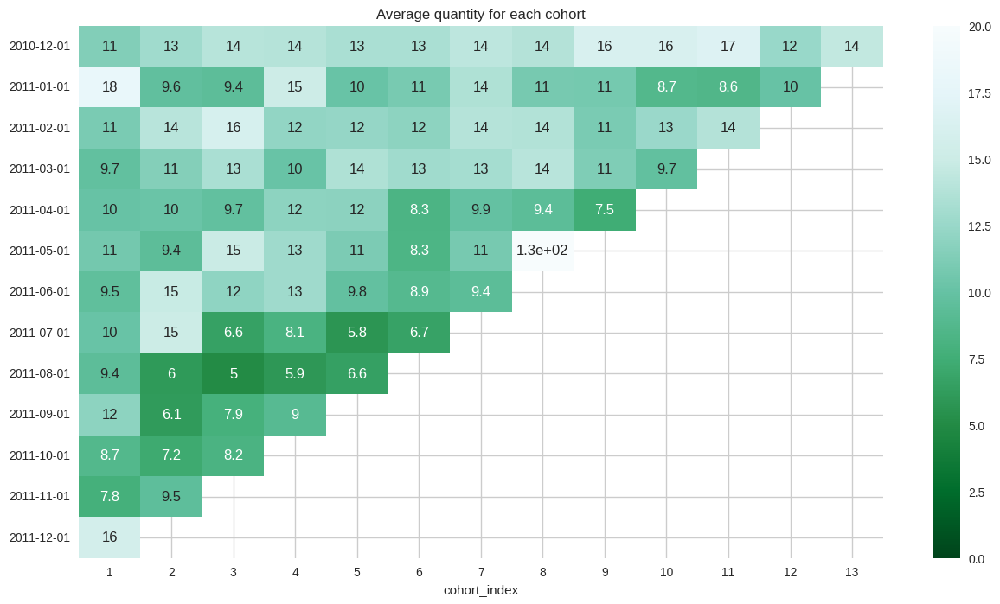

In [ ]:
plt.figure(figsize=(15, 8))
plt.title('Average quantity for each cohort')
sns.heatmap(data=average_quantity,annot = True,vmin = 0.0,vmax =20,cmap="BuGn_r")
plt.show()

## Create the 3rd Cohort: Average Sales


### i. Pivot Cohort and Cohort Retention

In [ ]:
grouping = df_uk.groupby(['cohort_month', 'cohort_index'])
cohort_data = grouping['total_price'].mean()
cohort_data = cohort_data.reset_index()
average_sales = cohort_data.pivot(index='cohort_month',columns='cohort_index',values='total_price')
average_sales.round(1)
average_sales.index = average_sales.index.date
average_sales

cohort_index,1,2,3,4,5,6,7,8,9,10,11,12,13
2010-12-01,21.165,22.436,23.966,23.762,20.249,25.819,25.978,23.912,26.251,31.458,31.121,21.721,24.508
2011-01-01,26.734,18.768,15.371,28.196,18.567,19.144,24.181,17.803,17.797,17.056,18.021,18.983,NaN
2011-02-01,16.967,20.129,19.370,19.164,17.554,16.125,21.252,22.962,18.232,21.961,23.922,NaN,NaN
2011-03-01,16.722,20.170,22.712,17.657,20.557,18.414,20.711,19.811,16.477,13.098,NaN,NaN,NaN
2011-04-01,16.553,20.094,19.249,18.669,19.085,14.127,14.934,15.302,11.547,NaN,NaN,NaN,NaN
2011-05-01,18.054,16.989,22.004,21.075,18.703,13.492,16.654,261.761,NaN,NaN,NaN,NaN,NaN
2011-06-01,22.905,15.231,19.640,16.555,13.334,13.313,12.727,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,14.862,24.679,10.277,12.903,9.283,9.354,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,15.157,13.013,12.070,15.632,17.114,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-09-01,18.256,11.496,13.651,13.969,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### ii. Visualize analysis of cohort 3 using seaborn and matplotlib modules

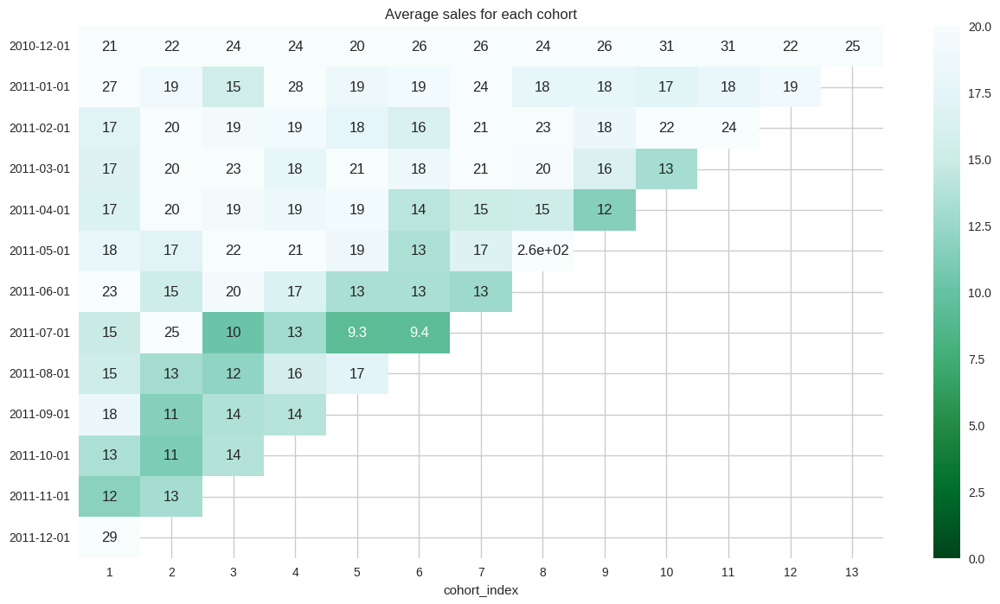

In [ ]:
plt.figure(figsize=(15, 8))
plt.title('Average sales for each cohort')
sns.heatmap(data=average_sales,annot = True,vmin = 0.0,vmax =20,cmap="BuGn_r")
plt.show()

For e-commerce organisations, cohort analysis is a unique opportunity to find out which clients are the most valuable to their business. By performing Cohort analysis we can get answers to following questions:

- How much effective was a marketing campaign held in a particular time period?
- Did the strategy employed to improve the conversion rates of Customers worked?
- Should I focus more on retention rather than acquiring new customers?
- Are my customer nurturing strategies effective?
- Which marketing channels bring me the best results?
- Is there a seasoanlity pattern in Customer behahiour?

**We have come to the end of the work.**
**I hope it was useful.**
**I would be very happy if you send your constructive and educational comments about the kernel.**